# Notebook to compute the Glacier "response time" at different scales and to look into glacier model differences of response times...

**no lowess fit needed, but the shift needed - (updated partly to Feb2024 update)**

In [1]:
# # these code lines above are equal to those at the beginning of 2_glacier_vs_climate_change


# download it here https://cluster.klima.uni-bremen.de/~lschuster/glacierMIP3_analysis/glacierMIP3_{DATE}_models_all_rgi_regions_sum_scaled.nc
# and change the path to your local path
DATE = 'Feb12_2024' #'Jun29' #'apr04' (has OGGM runaway effect of glaciers inside)

fill_option = 'repeat_last_101yrs'

import xarray as xr
import numpy as np
import pandas as pd
import scipy
import os
import glob
import matplotlib.pyplot as plt
from datetime import date
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
# for plots withinplots 
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

try:
    path_merged_runs_scaled_extend = f'/home/www/lschuster/glacierMIP3_analysis/glacierMIP3_{DATE}_models_all_rgi_regions_sum_scaled_extended_{fill_option}.nc'
    ds_reg_models_extend = xr.open_dataset(path_merged_runs_scaled_extend)

except:
    path_merged_runs_scaled_extend = f'/home/lilianschuster/Downloads/glacierMIP3_{DATE}_models_all_rgi_regions_sum_scaled_extended_{fill_option}.nc'
    ds_reg_models_extend = xr.open_dataset(path_merged_runs_scaled_extend)

# --> comes from isimip3b_postprocessing_analysis/isimip3b_postprocess_to_monthly.ipynb
pd_global_temp_exp = pd.read_csv('../data/temp_ch_ipcc_isimip3b.csv', index_col = 0)


from help_functions import pal_models, model_order, d_reg_num_name, model_order_anonymous, compute_steady_state_yr
hue_order_anonymous = []

pal_models_l = []
hue_order = []
for m, p in zip(model_order, pal_models):
    if (m!='OGGM-VAS') and (m!='OGGM_v153') and (m!='Huss'):
        hue_order.append(m)
        pal_models_l.append(p)
for m in hue_order:
    hue_order_anonymous.append(model_order_anonymous[m])
pal_models = pal_models_l

print(hue_order, hue_order_anonymous)
# select the right models:
ds_reg_models_extend = ds_reg_models_extend.sel(model_author = hue_order)
pal_models = sns.color_palette(pal_models)

dict_model_col = {}
for c,m in zip(pal_models, hue_order):
    dict_model_col[m] = c
    
# select the right models

glac_models = hue_order
ds_reg_models_extend = ds_reg_models_extend.sel(model_author=glac_models)
ds_reg_models_vol = ds_reg_models_extend.volume_m3 #.isel(simulation_year=slice(0,2000)) #['relative volume change (in %)']

# Let's take the median estimate from all glacier models for every RGI region and then do the sum:
ds_reg_models_vol = ds_reg_models_vol.stack(experiments=['gcm','period_scenario'])
ds_reg_models_med_vol = ds_reg_models_vol.median(dim='model_author')

num_dict = {0:'(a)', 1:'(b)', 2:'(c)', 3:'(d)', 4: '(e)', 5:'(f)', 6:'(g)', 7:'(h)', 8:'(i)', 9:'(j)', 10:'(k)', 11:'(l)', 12:'(m)'} 


def get_glob_temp_exp(region='global'):
    pd_global_temp_exp_glac = pd.read_csv('../data/temp_ch_ipcc_isimip3b_glacier_regionally.csv', index_col = 0)
    _p = pd_global_temp_exp_glac.loc[pd_global_temp_exp_glac.region == region]
    _p = _p.groupby(['gcm','period_scenario']).mean()
    return _p
np.testing.assert_allclose(get_glob_temp_exp(region='global')['temp_ch_ipcc'].values,
                                  pd_global_temp_exp.groupby(['gcm','period_scenario']).mean()['temp_ch_ipcc'].values, rtol=1e-5)
import matplotlib
matplotlib.__version__
pd_global_temp_exp_m = get_glob_temp_exp(region='global')


['PyGEM-OGGM_v13', 'GloGEMflow', 'GloGEMflow3D', 'OGGM_v16', 'GLIMB', 'Kraaijenbrink', 'GO', 'CISM2'] ['model 1', 'model 2', 'model 3', 'model 4', 'model 5', 'model 6', 'model 7', 'model 8']


In [2]:
approach = '_via_5yravg'
ds_reg_yr_shift= xr.open_dataset(f'/home/www/lschuster/glacierMIP3_analysis/all_shifted_glacierMIP3_{DATE}_models_all_rgi_regions_sum_scaled_extended_{fill_option}{approach}.nc')

In [3]:
global_models = ds_reg_models_extend.sel(simulation_year=0).dropna(dim='model_author',how='any').model_author.values

In [4]:
# -99,-95,-90,-80,-50,+50
def resp_time_estimate(model_author='OGGM_v16', perc_change_l=[-50],
                       rgi_reg='11', min_perc_change=20, roll_volume=21, shift_years=False):
    # let's use per default a rolling average of 21
    # computes "resp time" estimate for all 80 experiments of a given model_author and rgi_reg 
    # perc_change : -50 (gives estimates of how fast 50% of total volume change occurs)
    # HERE, the first occurrence of -50% change over the roll_volume avg. is used, 
    # alternatively we could use the last occurrence, but this would "mean" something different of course ... 
    # we also select the equilibrium volume by averaging over the last 100 years, this is necessary due to the large interdecadal variability of some models
    # MAYBE could even select there 200 or 300 years (but then we would also need to check how the data is "extended"...
    if shift_years:
        # we shift by maximum by +50 years, so like that there should always be values inside 
        _ds_reg_models_extend = ds_reg_yr_shift.sel(year_after_2020=slice(0,4950))
    else:
        _ds_reg_models_extend = ds_reg_models_extend
    if rgi_reg == 'All':
        if model_author in global_models:
            ds_reg_models_vol_all = _ds_reg_models_extend.volume_m3.sum(dim='rgi_reg')
        else:
            raise Exception("not a global model!!!")
    
    else:
        ds_reg_models_vol_all = _ds_reg_models_extend.volume_m3.sel(rgi_reg=rgi_reg) # .sel(simulation_year=slice(0,2000)) # need to do the interpolation first !!!!

    ds_reg_models_vol_all = ds_reg_models_vol_all.stack(experiments=['gcm','period_scenario'])
    #if not shift_years:
    ds_reg_models_vol_all = ds_reg_models_vol_all.assign_coords(temp_ch_ipcc = ('experiments',
                                                                      pd_global_temp_exp_m.loc[ds_reg_models_vol_all.experiments, # make sure that we use the same experiments
                                                                                               'temp_ch_ipcc']))
    ds_reg_models_sel_vol_all = ds_reg_models_vol_all.sel(model_author=model_author)
    # steady state is the average of the last 100 years!!!
    if shift_years:
        v_eq = ds_reg_models_sel_vol_all.sel(year_after_2020=slice(4901-50,5000-50)).mean(dim='year_after_2020')
        v0 = ds_reg_models_sel_vol_all.sel(year_after_2020=0) 
    else:
        v_eq = ds_reg_models_sel_vol_all.sel(simulation_year=slice(4901,5000)).mean(dim='simulation_year')
        v0 = ds_reg_models_sel_vol_all.isel(simulation_year=0)
    
    pd_category_resp_time = pd.DataFrame(index=ds_reg_models_vol_all.experiments)
    if rgi_reg == 'All':
        pd_category_resp_time['rgi_reg'] = f'All'
    else:
        pd_category_resp_time['rgi_reg'] = f'RGI{rgi_reg}'
    pd_category_resp_time['model_author'] = model_author
    pd_category_resp_time['min_perc_change'] = min_perc_change
    #if shift_years:
    #    pd_category_resp_time.loc[ds_reg_models_vol_all.experiments, 'temp_ch_ipcc']  = _ds_reg_models_extend.temp_ch_ipcc.values
    #else:
    pd_category_resp_time.loc[ds_reg_models_vol_all.experiments, 'temp_ch_ipcc']  = ds_reg_models_vol_all.temp_ch_ipcc.values
    # did it grow, shrink or stay the same???
    pd_category_resp_time['category'] = r'similar to V$_{0}$'
    grow_exps = v_eq.where(v_eq/v0 >=1+min_perc_change/100, drop=True).experiments.values
    pd_category_resp_time.loc[grow_exps, 'category'] = 'grow'
    shrink_exps = v_eq.where(v_eq/v0 <=1-min_perc_change/100, drop=True).experiments.values
    pd_category_resp_time.loc[shrink_exps, 'category'] = 'shrink'
    pd_category_resp_time['shift_years'] = shift_years
    for perc_change in perc_change_l:
        # response time computation
        # V(resp_t) = -perc/100 * (V_eq-v0)+v0)
        # we need the absolute because we only want to have either shrinking (negative perc) or growing (positive perc) 
        # experiments
        v_resp_t = v0 + (perc_change/100)*np.abs(v0-v_eq)
        #condi1 = (v_eq <= v_resp_t) & (v_resp_t <= v0)  # shrinking
        #condi2 = (v_eq >= v_resp_t) & (v_resp_t >= v0)
        #print(condi1, condi2, v_resp_t)
        #assert np.all(condi1 | condi2)
        if shift_years:
            v_roll = ds_reg_models_sel_vol_all.rolling(year_after_2020=roll_volume, center=True).mean()
            # we take the last year where the anti-condition holds true (so it is basically the first year where the condition holds true)
            resp_t = v_roll.where(v_roll<=v_resp_t).idxmax(dim='year_after_2020')
            #print(v_roll, resp_t)
        else:
            v_roll = ds_reg_models_sel_vol_all.rolling(simulation_year=roll_volume, center=True).mean()
            # we take the last year where the anti-condition holds true (so it is basically the first year where the condition holds true)
            resp_t = v_roll.where(v_roll<=v_resp_t).idxmax(dim='simulation_year')
        if perc_change<0:
            # if we look at how much it shrinks it should at least shrink by min_perc_change to estimate a "response time"
            resp_t = resp_t.where(v_eq/v0 <=1-min_perc_change/100, np.NaN)
        else:
            # if we look at how much it grows it should at least grow by min_perc_change to estimate a "response time"
            #print(resp_t, v_eq/v0)
            resp_t = resp_t.where(v_eq/v0 >=1+min_perc_change/100, np.NaN)
        if perc_change>0:
            perc_change_i = f'+{perc_change}'
        else:
            perc_change_i = perc_change
        pd_category_resp_time.loc[resp_t.experiments,f'resp_time_{perc_change_i}%'] = resp_t.values
    
    return pd_category_resp_time #, resp_t, v_eq/v0

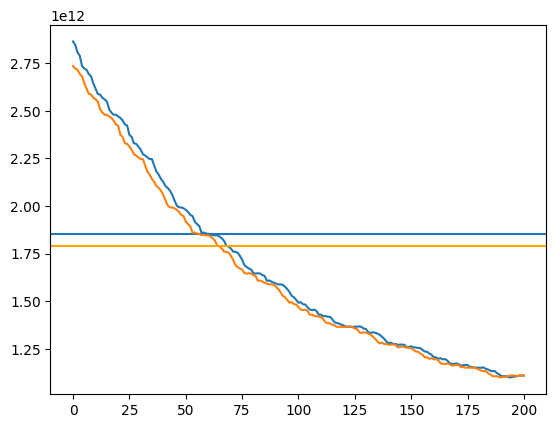

In [5]:
m = 'PyGEM-OGGM_v13'
perc = -80
rgi_reg='14'
shift_years=True
model_author=m
min_perc_change=25
perc_change_l = [perc]
_no =ds_reg_models_extend.volume_m3.sel(period_scenario='2081-2100_ssp126').isel(gcm=0).sel(model_author=m).sel(rgi_reg=rgi_reg)
_shift = ds_reg_yr_shift.volume_m3.sel(period_scenario='2081-2100_ssp126').isel(gcm=0).sel(model_author=m).sel(rgi_reg=rgi_reg)
plt.plot(_no.sel(simulation_year=slice(0,200)).T);
plt.axhline(_no.sel(simulation_year=0) - (_no.sel(simulation_year=0) - _no.sel(simulation_year=slice(4900,5000)).mean(dim='simulation_year'))/2)
plt.plot(_shift.sel(year_after_2020=slice(0,200)));
plt.axhline(_shift.sel(year_after_2020=0) - (_shift.sel(year_after_2020=0) - _shift.sel(year_after_2020=slice(4800,4900)).mean(dim='year_after_2020'))/2,
           color='orange')


<AxesSubplot:xlabel='temp_ch_ipcc', ylabel='resp_time_-80%'>

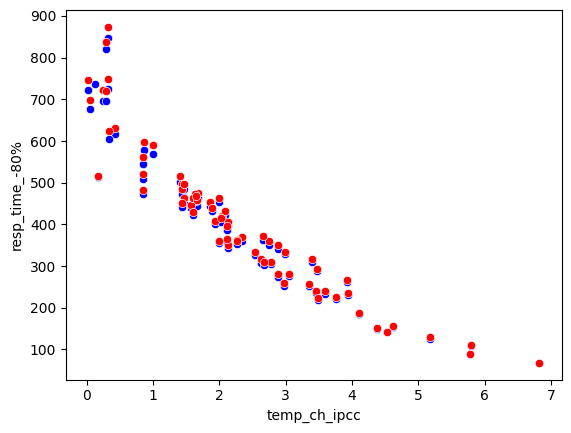

In [7]:
_r_no_shift = resp_time_estimate(model_author=m, perc_change_l=[perc],
                   rgi_reg='All', min_perc_change=25, shift_years=False)
_r_w_shift = resp_time_estimate(model_author=m, perc_change_l=[perc],
                   rgi_reg='All', min_perc_change=25, shift_years=True)
sns.scatterplot(data=_r_no_shift.dropna(),
                x='temp_ch_ipcc', y=f'resp_time_{perc}%', color='blue')
sns.scatterplot(data=_r_w_shift.dropna(),
                x='temp_ch_ipcc', y=f'resp_time_{perc}%', color='red')

<AxesSubplot:xlabel='temp_ch_ipcc', ylabel='resp_time_-80%'>

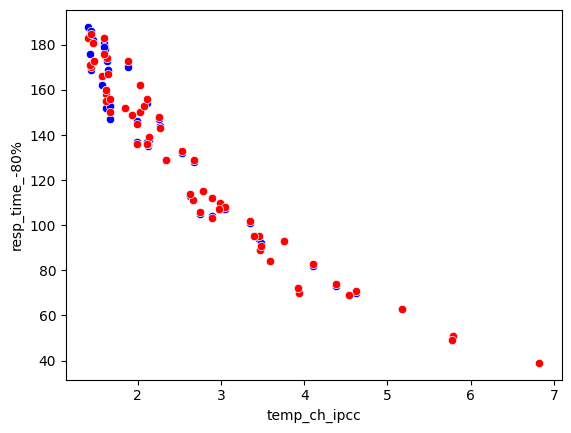

In [8]:
_r_no_shift = resp_time_estimate(model_author=m, perc_change_l=[perc],
                   rgi_reg=rgi_reg, min_perc_change=25, shift_years=False)
_r_w_shift = resp_time_estimate(model_author=m, perc_change_l=[perc],
                   rgi_reg=rgi_reg, min_perc_change=25, shift_years=True)
sns.scatterplot(data=_r_no_shift.dropna(),
                x='temp_ch_ipcc', y=f'resp_time_{perc}%', color='blue')
sns.scatterplot(data=_r_w_shift.dropna(),
                x='temp_ch_ipcc', y=f'resp_time_{perc}%', color='red')

In [9]:
pd_global_temp_exp_m = get_glob_temp_exp(region='global')

markers = ['^', 'X','s','o','D','v']

norm = plt.Normalize(vmin=pd_global_temp_exp_m['temp_ch_ipcc'].min(),
                     vmax=pd_global_temp_exp_m['temp_ch_ipcc'].max())
cmap = sns.color_palette('flare', as_cmap=True) #sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# plot specific delta T:
col_temp_l = []
exp_l = []
for temp in [0,1.5,2,3,4,5]: #,5,6]:
    exp = np.abs(pd_global_temp_exp_m-temp).sort_values(by='temp_ch_ipcc').iloc[0].name
    #sm.colorbar.norm...
    col_temp = cmap(norm(pd_global_temp_exp_m.loc[exp]['temp_ch_ipcc']))
    col_temp_l.append(col_temp)
    exp_l.append(exp)

- only when we set a threshold of how much volume loss has to occur, we get response times that are not totally noisy 
    - much less noise, when choosing min_perc_change=25, instead of min_perc_change=10, however,it also results in more models where no response time can be estimated, which is not good. 

**TODO: the tests are NOT working, WHY???**

In [8]:
# test
rgi_regs = []
for rgi_reg in np.arange(1,20,1):
    if rgi_reg < 10:
        rgi_reg = '0'+str(rgi_reg)
    else:
        rgi_reg = str(rgi_reg)
    rgi_regs.append(rgi_reg)

for model_author in ['OGGM_v16', 'OGGM-VAS', 'Compagno']:
    for rgi_reg in rgi_regs:
        pd_test = resp_time_estimate(model_author=model_author, perc_change_l=[-50],
                           rgi_reg=rgi_reg, min_perc_change=25)
        pd_test = pd_test.dropna()
        pd_test = pd_test.loc[pd_test.temp_ch_ipcc>1.2]

        for j,ind in enumerate(pd_test.index):
            ds_test = ds_reg_models_extend.volume_m3.sel(model_author=model_author, rgi_reg=rgi_reg).stack(experiments=['gcm','period_scenario']).sel(experiments=pd_test.index[j])
            ds_init = ds_test[0].values
            ds_test = ds_test.rolling(simulation_year=10, center=True).mean()
            vol_change_at_resp_time_yr = ds_init-ds_test.sel(simulation_year = pd_test.iloc[j]['resp_time_-50%']-1).values
            #print(vol_change_at_resp_time_yr.values)
            #np.testing.assert_allclose(vol_change_at_resp_time_yr, 0.5*(ds_test[0]-ds_test[-100:].mean()), rtol=0.003)
            np.testing.assert_allclose(vol_change_at_resp_time_yr, 0.5*(ds_init-ds_test[-10]), rtol=0.1)

AssertionError: 
Not equal to tolerance rtol=0.1, atol=0

Mismatched elements: 1 / 1 (100%)
Max absolute difference: 5.70879836e+10
Max relative difference: 0.10926528
 x: array(5.795594e+11, dtype=float32)
 y: array(5.224714e+11)

In [9]:
vol_change_at_resp_time_yr = ds_init-ds_test.sel(simulation_year = 11).values
np.testing.assert_allclose(vol_change_at_resp_time_yr, 0.5*(ds_init-ds_test[-10]), rtol=0.01)

AssertionError: 
Not equal to tolerance rtol=0.01, atol=0

Mismatched elements: 1 / 1 (100%)
Max absolute difference: 1.52956469e+11
Max relative difference: 0.29275569
 x: array(6.754278e+11, dtype=float32)
 y: array(5.224714e+11)

In [ ]:
# test
rgi_regs = []
for rgi_reg in np.arange(1,20,1):
    if rgi_reg < 10:
        rgi_reg = '0'+str(rgi_reg)
    else:
        rgi_reg = str(rgi_reg)
    rgi_regs.append(rgi_reg)

for model_author in ['OGGM_v16', 'OGGM-VAS', 'Compagno']:
    for rgi_reg in rgi_regs:
        pd_test = resp_time_estimate(model_author=model_author, perc_change_l=[-50],
                           rgi_reg=rgi_reg, min_perc_change=20, shift_years=True)
        pd_test = pd_test.dropna()

        for j,ind in enumerate(pd_test.index):
            ds_test = ds_reg_models_extend.volume_m3.sel(model_author=model_author, rgi_reg=rgi_reg).stack(experiments=['gcm','period_scenario']).sel(experiments=pd_test.index[j])
            ds_test = ds_test.rolling(simulation_year=5, center=True).mean()
            vol_change_at_resp_time_yr = ds_test[0]-ds_test.sel(simulation_year = pd_test.iloc[j]['resp_time_-50%'])
            np.testing.assert_allclose(vol_change_at_resp_time_yr, 0.5*(ds_test[0]-ds_test[-1]), rtol=0.003)

In [24]:
resp_time_estimate(model_author='OGGM_v16', perc_change_l=[-50],
                           rgi_reg='All', min_perc_change=20, shift_years=True)

,rgi_reg,model_author,min_perc_change,temp_ch_ipcc,category,shift_years,resp_time_-50%
"(gfdl-esm4, 1995-2014_hist)",All,OGGM_v16,20,0.841467,shrink,True,112.0
"(gfdl-esm4, 2021-2040_ssp126)",All,OGGM_v16,20,1.433792,shrink,True,90.0
"(gfdl-esm4, 2021-2040_ssp370)",All,OGGM_v16,20,1.428564,shrink,True,86.0
"(gfdl-esm4, 2021-2040_ssp585)",All,OGGM_v16,20,1.469802,shrink,True,86.0
"(gfdl-esm4, 2041-2060_ssp126)",All,OGGM_v16,20,1.618750,shrink,True,95.0
...,...,...,...,...,...,...,...
"(ukesm1-0-ll, 2061-2080_ssp370)",All,OGGM_v16,20,4.379977,shrink,True,30.0
"(ukesm1-0-ll, 2061-2080_ssp585)",All,OGGM_v16,20,5.170543,shrink,True,25.0
"(ukesm1-0-ll, 2081-2100_ssp126)",All,OGGM_v16,20,2.978482,shrink,True,43.0
"(ukesm1-0-ll, 2081-2100_ssp370)",All,OGGM_v16,20,5.780495,shrink,True,21.0


In [304]:
pd_test = resp_time_estimate(model_author='James', perc_change_l=[-50],
                           rgi_reg='06', min_perc_change=25)
pd_test.dropna().min(), pd_test.dropna().max()

(rgi_reg               RGI06
 model_author          James
 min_perc_change          25
 temp_ch_ipcc       0.998767
 category             shrink
 shift_years           False
 resp_time_-50%         10.0
 dtype: object,
 rgi_reg               RGI06
 model_author          James
 min_perc_change          25
 temp_ch_ipcc       6.824361
 category             shrink
 shift_years           False
 resp_time_-50%         23.0
 dtype: object)

In [321]:
ds_reg_yr_shift

<xarray.Dataset>
Dimensions:                           (model_author: 9, year_after_2020: 5101,
                                       rgi_reg: 19, period_scenario: 13, gcm: 5)
Coordinates:
  * model_author                      (model_author) object 'CISM2' ... 'Zeko...
  * year_after_2020                   (year_after_2020) float64 -100.0 ... 5e+03
  * rgi_reg                           (rgi_reg) object '01' '02' ... '18' '19'
  * period_scenario                   (period_scenario) object '1995-2014_his...
  * gcm                               (gcm) object 'gfdl-esm4' ... 'ukesm1-0-ll'
Data variables:
    simulation_year                   (model_author, rgi_reg, year_after_2020, period_scenario, gcm) float64 ...
    temp_ch_ipcc                      (model_author, rgi_reg, year_after_2020, period_scenario, gcm) float64 ...
    yrs_w_most_similar_state_to_2020  (model_author, rgi_reg, year_after_2020, period_scenario, gcm) float64 ...
    volume_rel_2020_%                 (model_author, rgi_reg, year_after_2020, period_scenario, gcm) float64 ...
    volume_m3                         (model_author, rgi_reg, year_after_2020, period_scenario, gcm) float64 ...

In [305]:
pd_test = resp_time_estimate(model_author='James', perc_change_l=[-50],
                           rgi_reg='06', min_perc_change=25, shift_years=True)
pd_test.dropna().min(), pd_test.dropna().max()

(rgi_reg               RGI06
 model_author          James
 min_perc_change          25
 temp_ch_ipcc       0.998767
 category             shrink
 shift_years            True
 resp_time_-50%         10.0
 dtype: object,
 rgi_reg               RGI06
 model_author          James
 min_perc_change          25
 temp_ch_ipcc       6.824361
 category             shrink
 shift_years            True
 resp_time_-50%         26.0
 dtype: object)

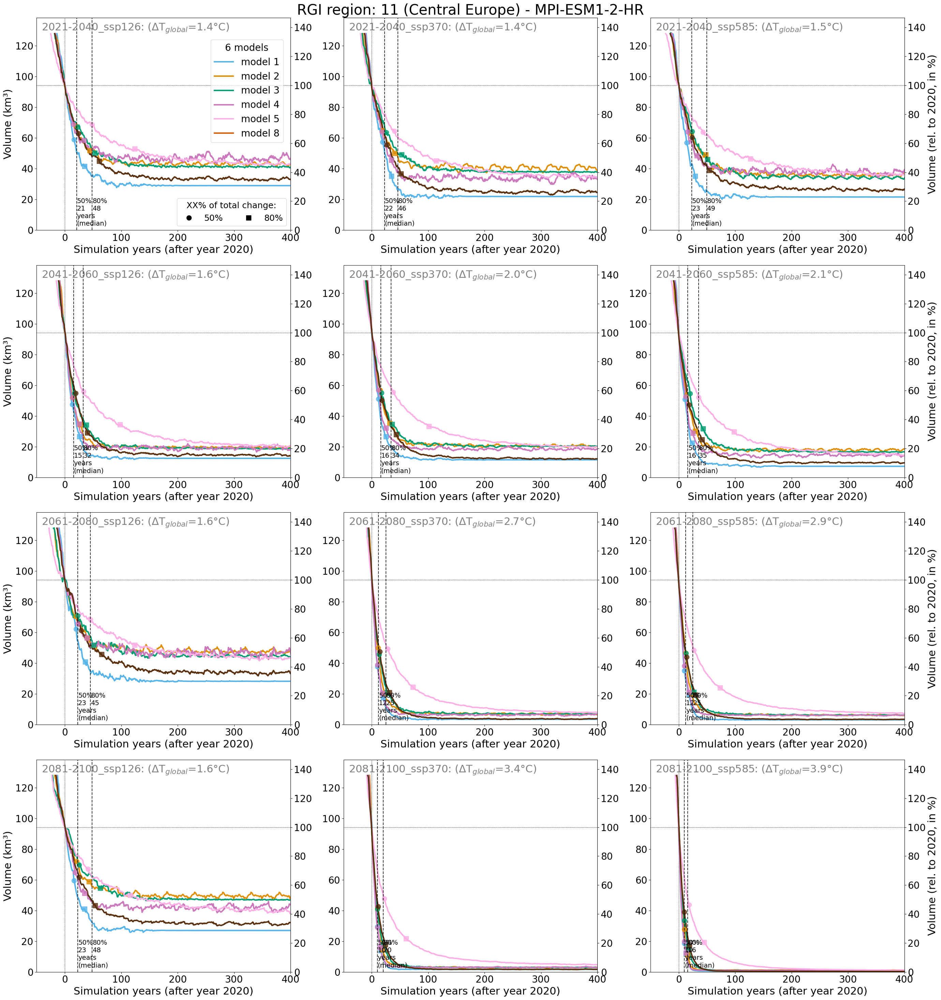

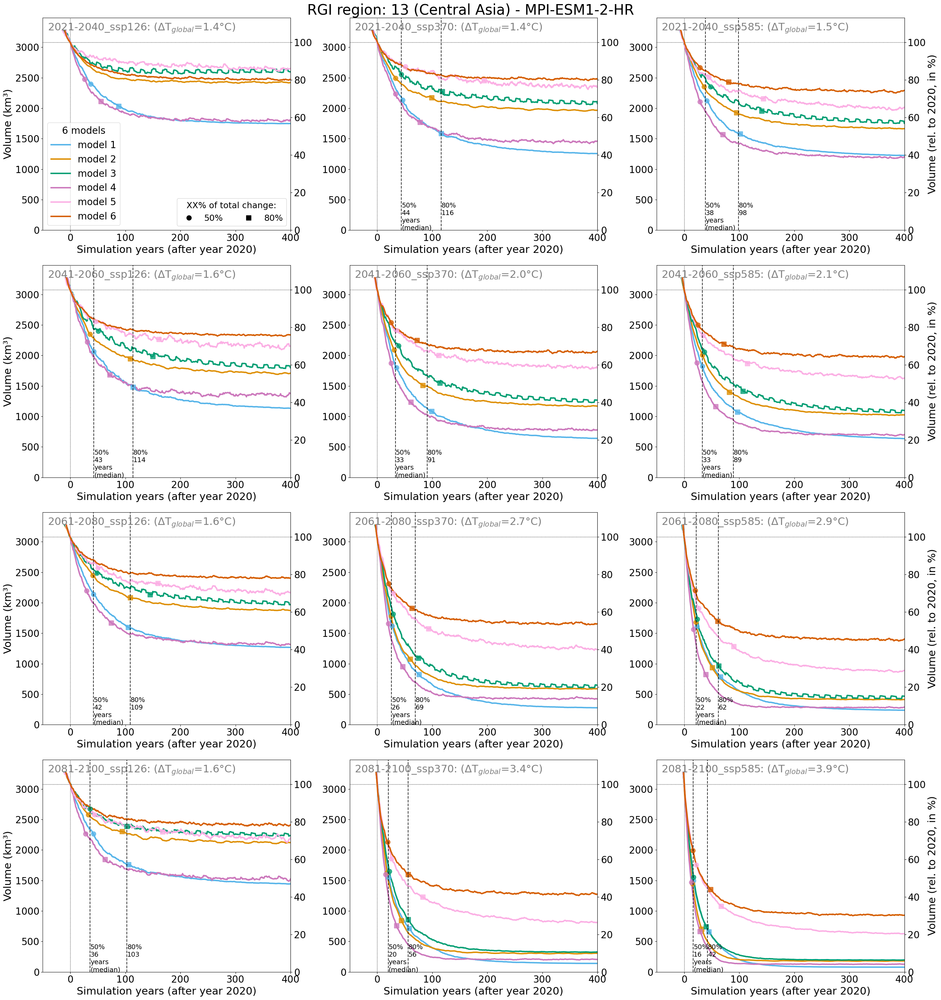

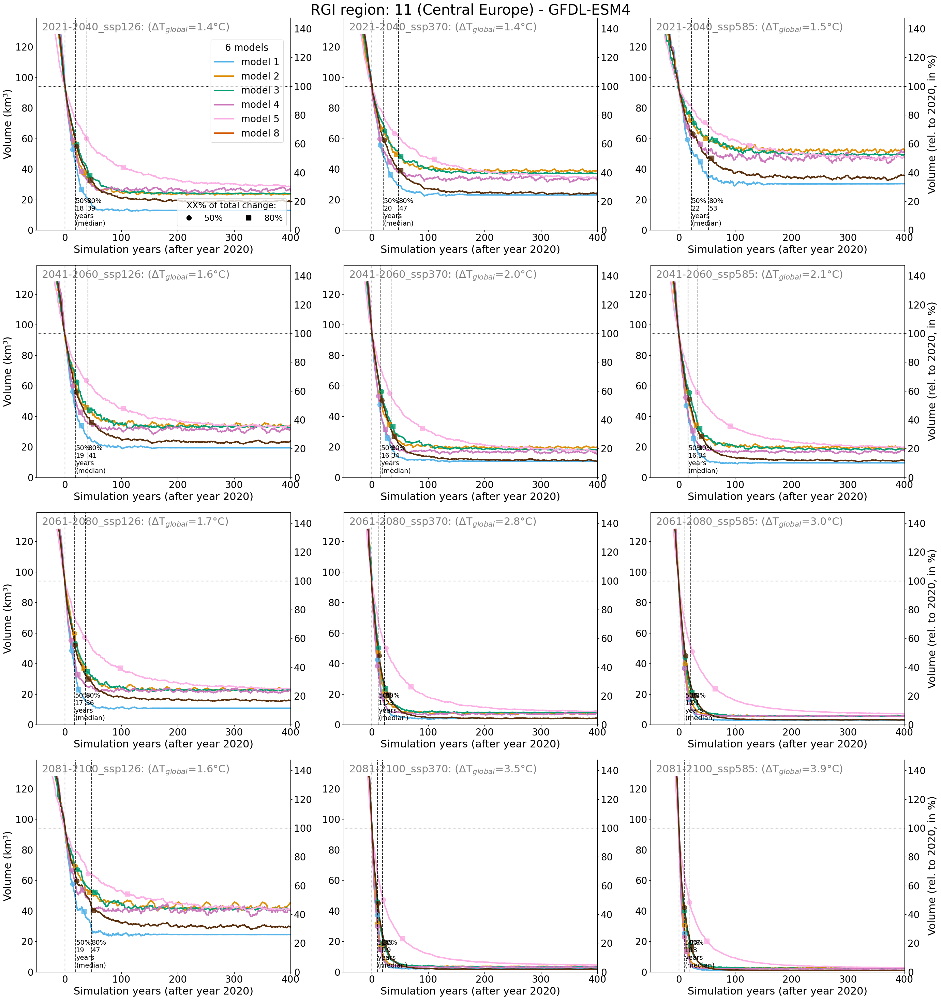

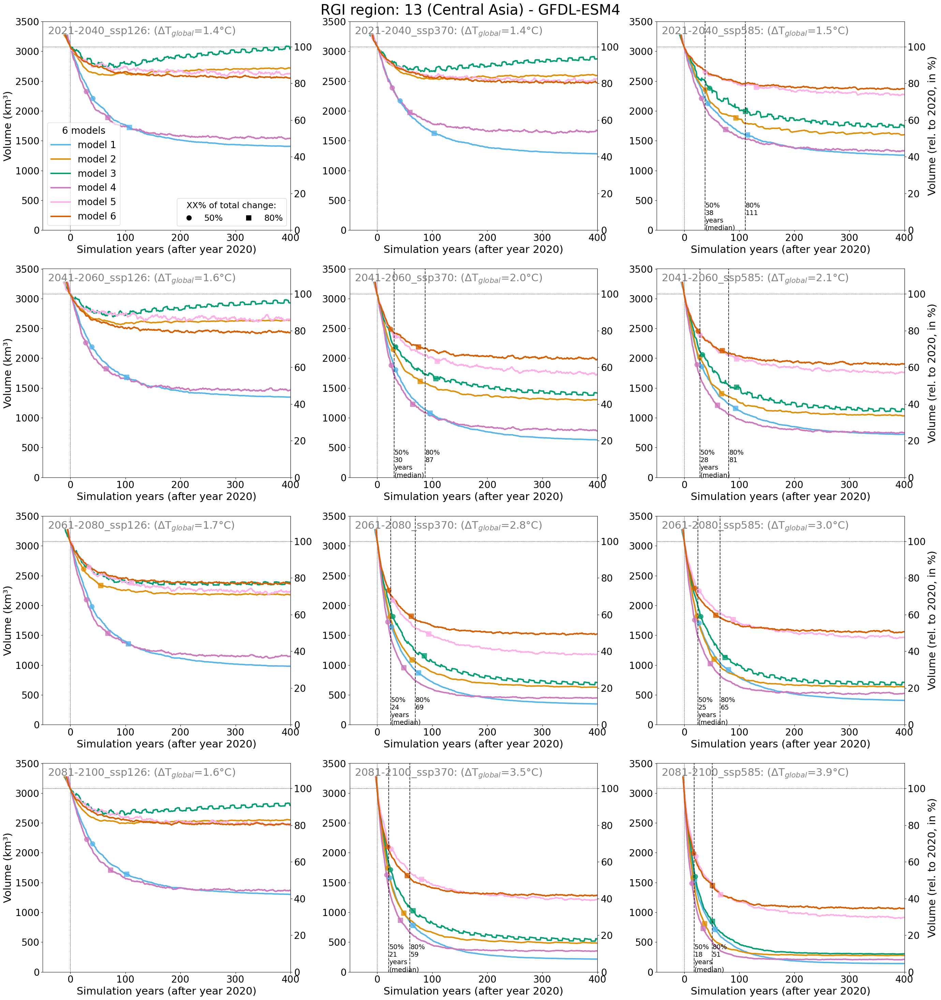

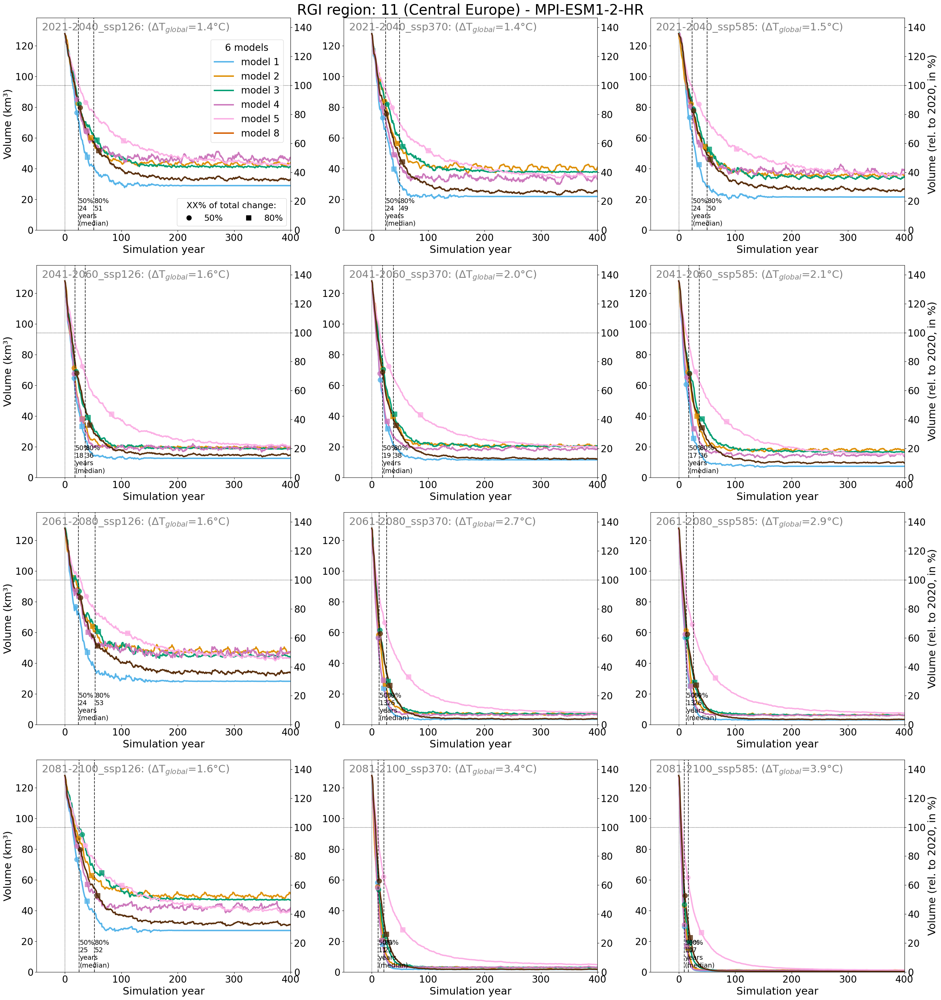

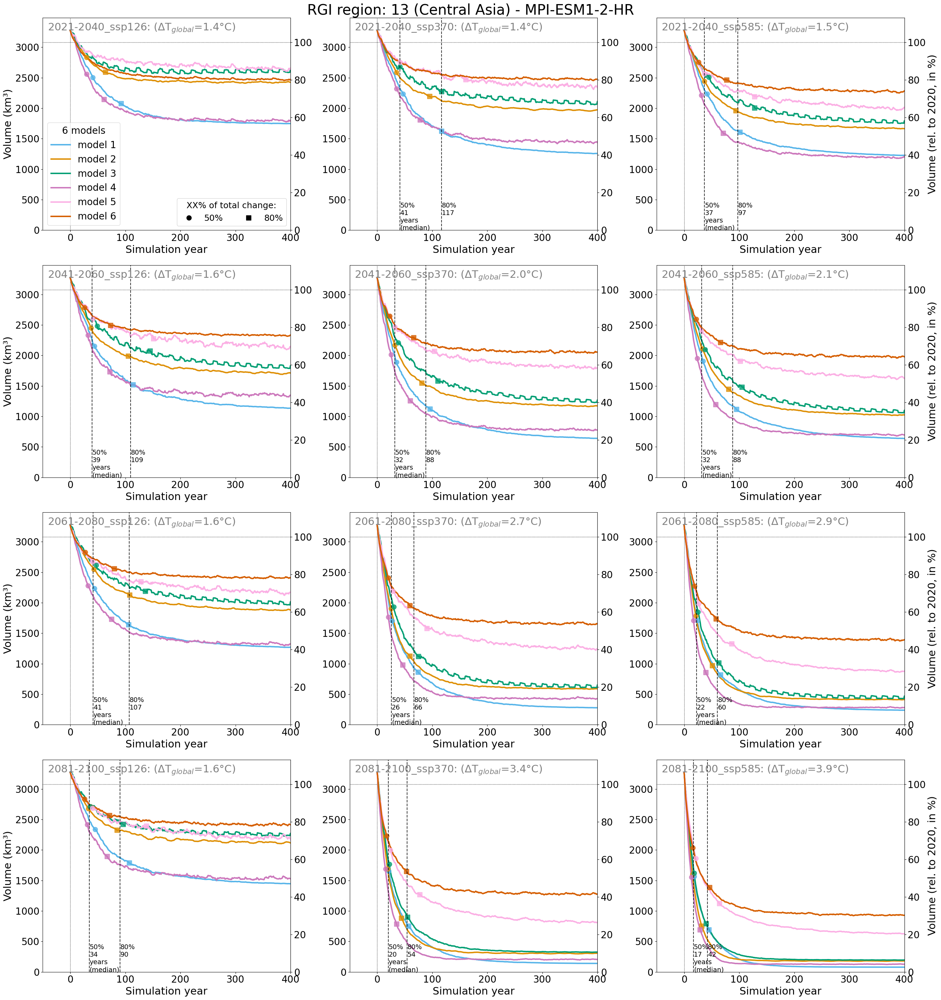

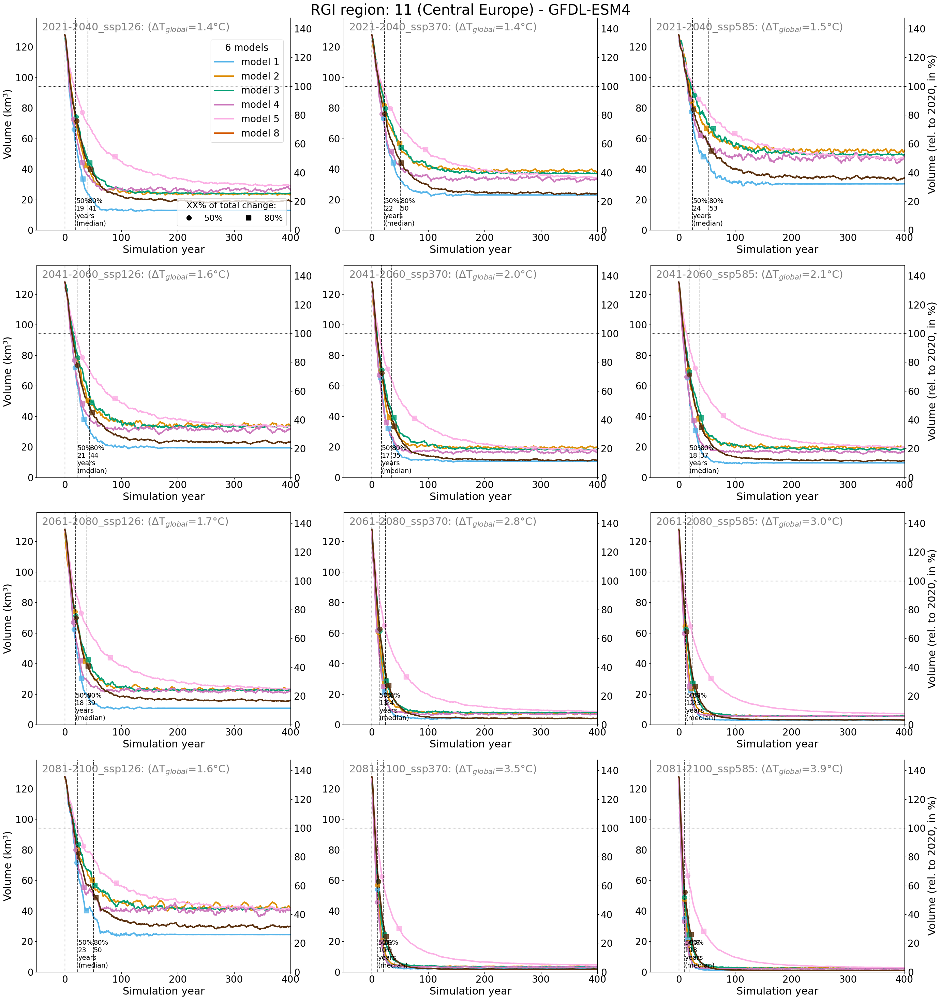

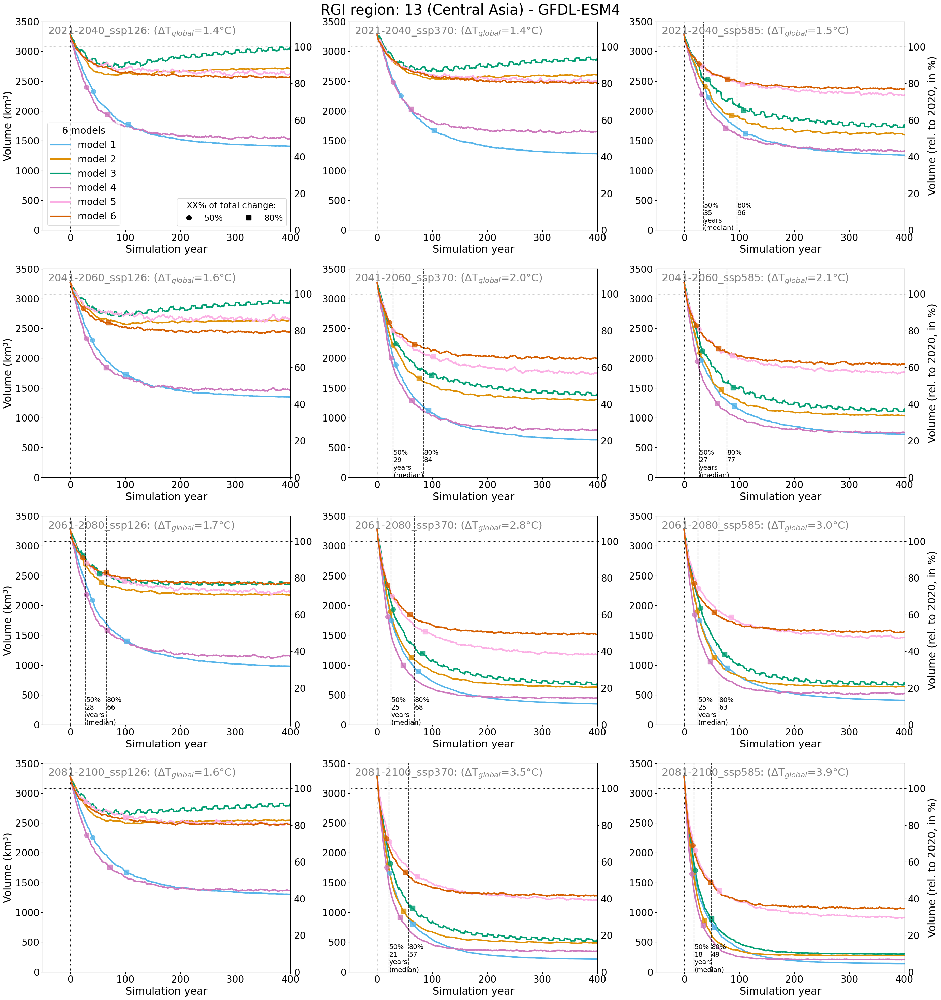

In [8]:
pd_global_temp_exp_glac = pd.read_csv('../data/temp_ch_ipcc_isimip3b_glacier_regionally.csv', index_col = 0)
pd_rgi_stats_w_hugonnet = pd.read_csv(f'rgi_vs_2020_volume_hugonnet_estimates{DATE}.csv', index_col = [0])

plt.rc('font', size=20)  
ls = 'solid'
only_80 = False #True
#sel_periods = ['1851-1870_hist','1995-2014_hist','2081-2100_ssp126','2081-2100_ssp585']
sel_periods =pd_global_temp_exp.loc[pd_global_temp_exp.temp_ch_ipcc>=1.2]['period_scenario'].unique()
#ds_reg_yr_shift.period_scenario.values
for shift_years in [True, False]: 
    for anonym in ['_anonym']: #'', 
        for gcm in ['mpi-esm1-2-hr','gfdl-esm4']:
            #for rgi_reg in ['11']:
            for rgi_reg in ['11','13']: #,'11']:
                vol_2020_reg = pd_rgi_stats_w_hugonnet.loc[rgi_reg][f'regional_volume_m3_2020{approach}']
                def vol_rel_2020_to_vol_km3(x, _vol_2020_reg = vol_2020_reg):
                    return x*_vol_2020_reg/1e9/100
                def vol_km3_to_vol_rel_2020(x, _vol_2020_reg = vol_2020_reg):
                    return x*1e9*100/_vol_2020_reg
                plt.figure(figsize=(28,30))
                axs = []
                for j,period_scenario in enumerate(sel_periods):
                    condi3 = (pd_global_temp_exp.period_scenario==period_scenario)
                    #condi2 = (pd_global_temp_exp_glac.region ==f'RGI{rgi_reg}_glacier')
                    temp_ch = pd_global_temp_exp.loc[(pd_global_temp_exp.gcm==gcm) & condi3]['temp_ch_ipcc'].round(1).values.squeeze()

                    if j==0:
                        ax0=plt.subplot(4,3,j+1)
                        ax = ax0
                    else:
                        order_ax = [1,4,7,10, 2,5,8,11,3,6,9,12]
                        #order_ax = [j+2,j+5,j,j+,j+6,j+1,j+3,j+6]
                        ax=plt.subplot(4,3,order_ax[j],sharey=ax0)
                    axs.append(ax)
                    if shift_years:
                        # we shift by maximum by +100 years, so like that there should always be values inside 
                        pd_reg_vol_sel = ds_reg_yr_shift.sel(year_after_2020=slice(-100,4900)).volume_m3.sel(period_scenario=period_scenario).sel(gcm=gcm).sel(rgi_reg=rgi_reg).to_dataframe().reset_index()
                        xx = 'year_after_2020'
                    else:
                        pd_reg_vol_sel = ds_reg_models_vol.sel(period_scenario=period_scenario).sel(gcm=gcm).sel(rgi_reg=rgi_reg).to_dataframe().reset_index()
                        xx = 'simulation_year'
                    pd_reg_vol_sel['volume (km³)'] = pd_reg_vol_sel['volume_m3']/1e9
                    pd_reg_vol_sel = pd_reg_vol_sel.dropna()

                    if ls == 'solid' and j==0:
                        sns.lineplot(x=xx, data=pd_reg_vol_sel, y='volume (km³)',
                                 hue='model_author', hue_order=dict_model_col.keys(), palette=dict_model_col.values(), ls=ls, legend='brief', lw=3, ax=ax)
                    else:
                        sns.lineplot(x=xx, data=pd_reg_vol_sel, y='volume (km³)',
                                 hue='model_author', hue_order=dict_model_col.keys(), palette=dict_model_col.values(), ls=ls, legend=False, lw=3, ax=ax)

                    # add runaway effect
                    #pd_reg_vol_sel_runaway_oggm = ds_reg_models_w_runaway.sel(period_scenario=period_scenario).sel(gcm=gcm).volume_m3.to_dataframe().reset_index()
                    #pd_reg_vol_sel_runaway_oggm['volume (km³)'] = pd_reg_vol_sel_runaway_oggm['volume_m3']/1e9

                    #sns.lineplot(x='simulation_year', data=pd_reg_vol_sel_runaway_oggm.loc[pd_reg_vol_sel_runaway_oggm.rgi_reg==rgi_reg], y='volume (km³)',
                    #             color=dict_model_col['OGGM_v16'], ls='--', legend=False, lw=0.5, #ax=ax,
                    #             alpha =1)

                    if j <4: #,3,6,9]: #4,8,12]:
                        plt.ylabel('Volume (km³)', fontsize=22)
                    else:
                        plt.ylabel('')

                    if shift_years:
                        plt.xlabel('Simulation years (after year 2020)', fontsize=22)
                    else:
                        plt.xlabel('Simulation year', fontsize=22)

                    if j==1:
                        minip, maxip = ax.get_ylim()
                    elif j==3:
                        minif, maxif = ax.get_ylim()
                    
                    for st,perc in zip(['o','s'],[-50,-80]):
                        if only_80 and perc == -50:
                            continue
                        yrs_l = []
                        for m,c in zip(dict_model_col.keys(),dict_model_col.values()):
                            pd_test = resp_time_estimate(model_author=m, perc_change_l=[perc],
                                                         rgi_reg=rgi_reg, min_perc_change=25,shift_years=shift_years)
                            try:
                                yr = pd_test.loc[pd_test.index == tuple([gcm, period_scenario])][f'resp_time_{perc}%'].values[0]
                            except:
                                yr=np.NaN
                            #yr = pd_test.loc[pd_ss_m.model_author==m]['simulation_year'].values#[0]
                            if not np.isnan(yr):
                                pd_vol_reg_m_sel = pd_reg_vol_sel.loc[pd_reg_vol_sel.model_author==m]

                                y = pd_vol_reg_m_sel.loc[pd_vol_reg_m_sel[xx]==yr]['volume (km³)'].values.squeeze()
                                #print(m,yr,y)
                                #if len(y)==1:
                                plt.plot([yr], [y], st, color=c, ms=10, alpha = 0.8)
                                yrs_l.append(yr)
                        #print(len(yrs_l))
                        if len(yrs_l)>=len(pd_reg_vol_sel.model_author.unique())-1: # should have estimates for almost all models to compute a median
                            yr_med = np.median(np.array(yrs_l))
                            plt.axvline([yr_med], color='black', alpha = 0.8,lw=1.5, ls='--')
                            #if j ==2:
                            if perc == -80:
                                if only_80:
                                    plt.text(yr_med+0.5,3,f'median:{int(yr_med)} years', fontsize=15)
                                else:
                                    plt.text(yr_med+0.5,3,f'{str(perc)[1:]}%\n{int(yr_med)}\n\n', fontsize=14)
                            else:
                                plt.text(yr_med+0.5,3,f'{str(perc)[1:]}%\n{int(yr_med)}\nyears\n(median)', fontsize=14)
                            #transform=plt.gca().transAxes)
                            #plt.plot([yr], [y], st, color=c, ms=10, alpha = 0.8)
                    ax.set_xlim([-50,400])

                    ax2 = ax.secondary_yaxis(1., functions=(vol_km3_to_vol_rel_2020, 
                                             vol_rel_2020_to_vol_km3))

                    if j >= 8: #[2]: #,5,8,11]: #[3]:
                        ax2.set_ylabel('Volume (rel. to 2020, in %)', fontsize=22)
                        #ax.set_yticklabels([])
                    else:
                        ax2.set_ylabel('')
                        #ax2.set_yticklabels([])

                    if j==0: 
                        _leg = ax.get_legend()
                        handles, labels = ax.get_legend_handles_labels()
                        _leg.remove()
                        models_reg = pd_reg_vol_sel.model_author.unique()
                        n = len(models_reg)
                        dict_model_col_reg = {}
                        list_reg_model_anonym = []
                        for h, p in zip(hue_order,pal_models):
                            if h in models_reg:
                                dict_model_col_reg[h]= p
                                list_reg_model_anonym.append(model_order_anonymous[h])
                        if rgi_reg == '11':
                            loc = 'upper right'
                            bbox_to_anchor = (0.99,0.92)
                        else:
                            loc = 'lower left'
                            bbox_to_anchor = (0,0)
                        if anonym:
                            leg = ax.legend(handles, list_reg_model_anonym, title=f'{n} models', loc=loc,
                                            framealpha = 0.7, #ncol=2,
                                            bbox_to_anchor=bbox_to_anchor
                                           )
                        else:
                            leg = ax.legend(handles, dict_model_col_reg.keys(), title=f'{n} models', loc=loc,
                                            framealpha = 0.7,
                                           bbox_to_anchor=bbox_to_anchor
                                           )
                        for legobj in leg.legendHandles:
                            legobj.set_linewidth(3.0)
                        leg.set_zorder = 5
                        minip, maxip = ax.get_ylim()
                        ax0 = ax
                    ax.set_ylim([0,maxip*1.02])
                    #leg.set_bbox_to_anchor([1,1])
                    ax.text(0.02,0.94, str(period_scenario) +r': ($\Delta$T$_{global}$'+f'={temp_ch}°C)', color='grey', 
                            fontsize=22, transform=ax.transAxes, zorder=6)

                    if j==0: #2 or j==5:
                        from matplotlib.lines import Line2D
                        import matplotlib.patches as mpatches
                        handles = []
                        # from data
                        # create manual symbols for legend
                        point1 = Line2D([0], [0], label='manual point', marker='o', markersize=10, 
                                 markeredgecolor='k', markerfacecolor='k', linestyle='')
                        point2 = Line2D([0], [0], label='manual point', marker='s', markersize=10, 
                                 markeredgecolor='k', markerfacecolor='k', linestyle='')
                        # add manual symbols to auto legend
                        handles.extend([point1, point2])
                        if only_80:
                            plt.legend(handles=handles, labels=['80% of\ntotal change'], 
                                       #title='XX% of\ntotal change:', 
                                       loc='lower right',
                                       title_fontsize=18, fontsize=18)
                        else:
                            plt.legend(handles=handles, labels=['50%','80%'], title='XX% of total change:', loc='lower right',
                                       title_fontsize=18, fontsize=18, ncol=2)
                        ax.add_artist(leg)

                    ax.axvline(0,ls=':', color='black', lw=1, zorder=-1)
                    ax.axhline(vol_2020_reg/1e9,ls=':', color='black', lw=1, zorder=-1)

                reg = d_reg_num_name[rgi_reg]
                plt.suptitle(f'RGI region: {rgi_reg} ({reg}) - {gcm.upper()}', fontsize=30)
                plt.tight_layout()
                if shift_years:
                    plt.savefig(f'figures/1_overview_timeseries_plots/gcm_separate_vol_time_series/shifted_sel_manuscript_vol_time_series_rgi_reg{rgi_reg}_{gcm}{anonym}_w_resp_time_rel_2020_{DATE}.png')
                else:
                    plt.savefig(f'figures/1_overview_timeseries_plots/gcm_separate_vol_time_series/sel_manuscript_vol_time_series_rgi_reg{rgi_reg}_{gcm}{anonym}_w_resp_time_rel_2020_{DATE}.png')


#### complex plot for all RGI regions ...

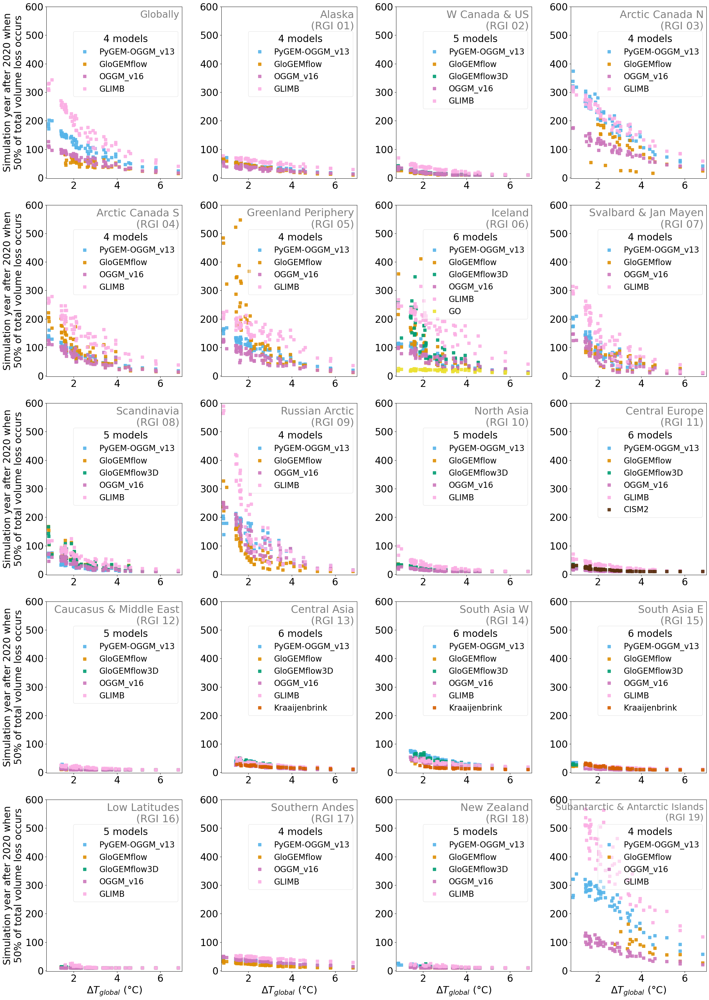

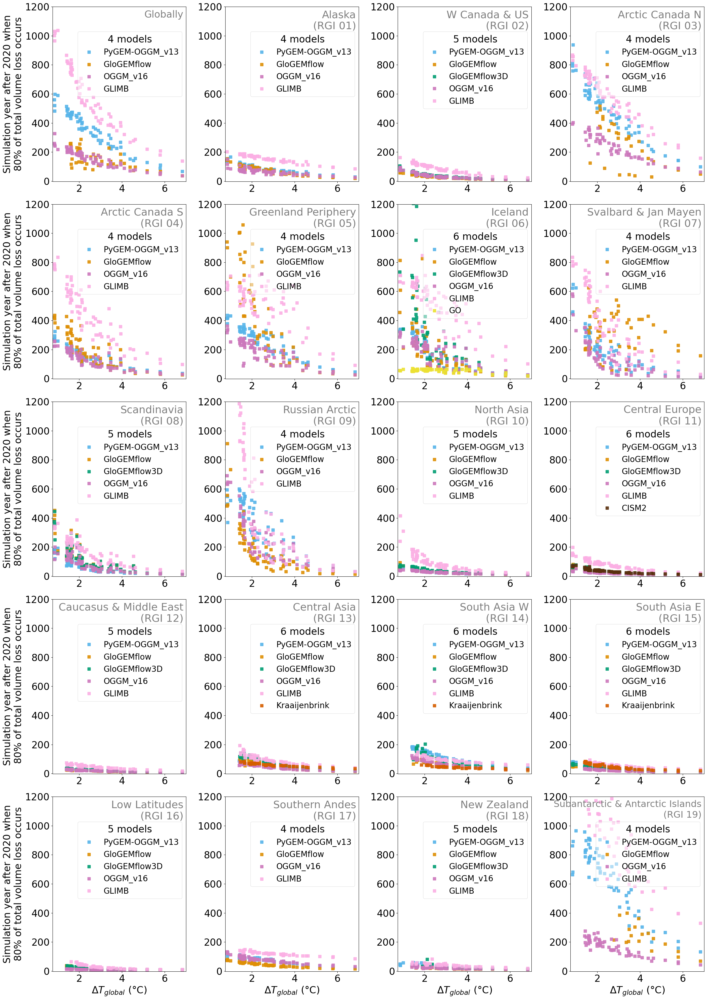

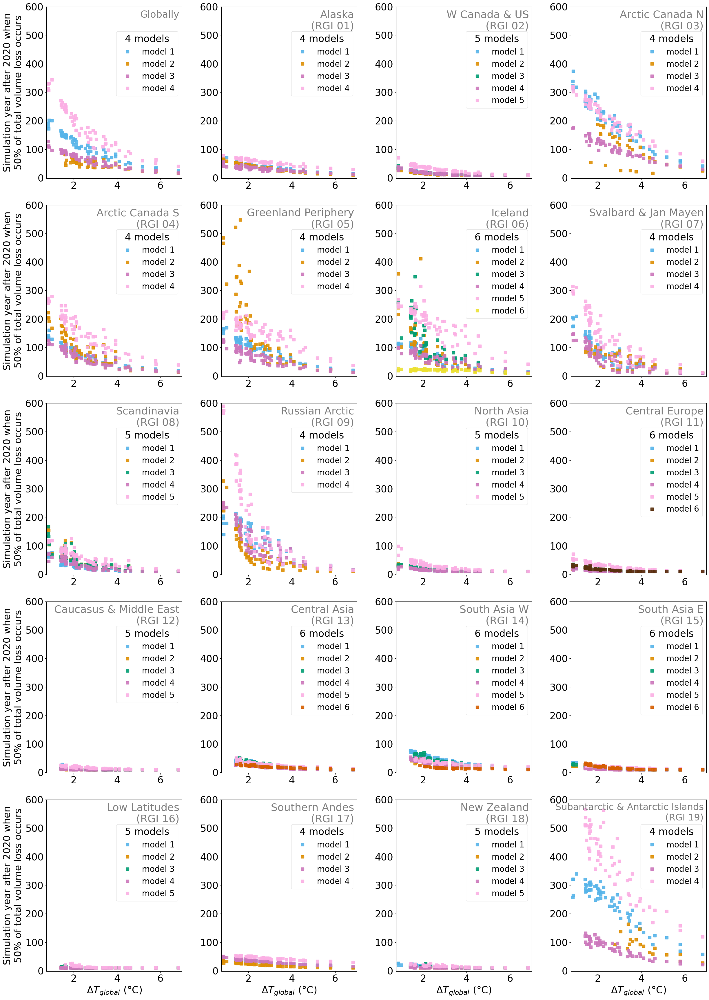

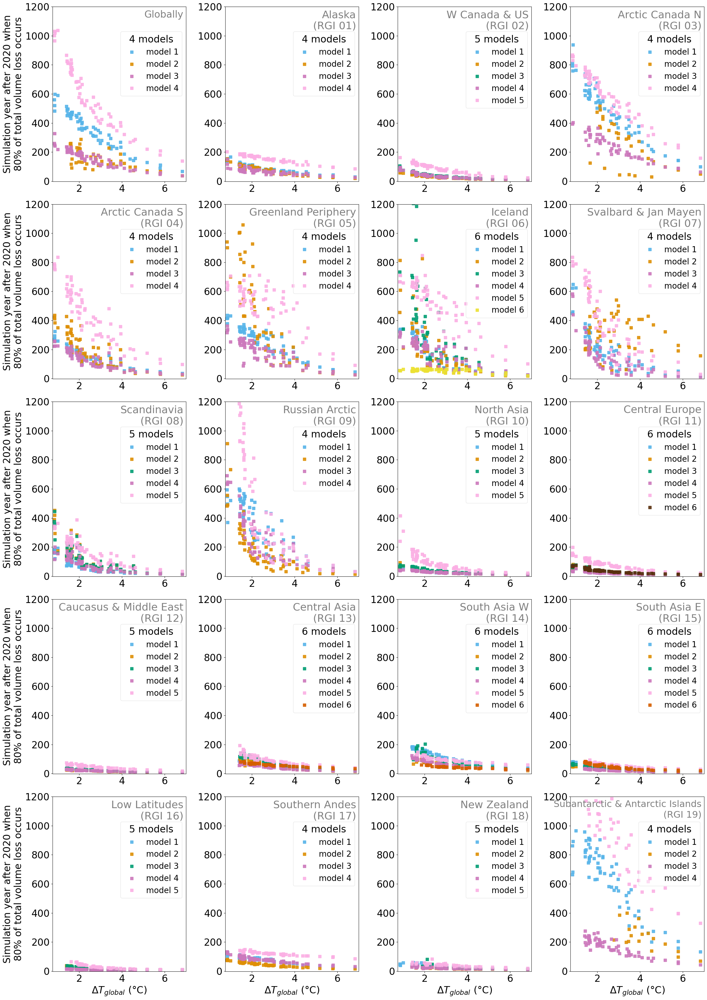

In [12]:
rgi_num_order = ['All', '19', '03', '01', '05', '09', '04', '07', '17', '06', '13', '14',
                 '02', '15', '08', '10', '11', '16', '18', '12'] # after initial volume ...
for shift_years in [True]: 
    if shift_years:
        # we shift by maximum by +50 years, so like that there should always be values inside 
        _ds_reg_models_extend = ds_reg_yr_shift.sel(year_after_2020=slice(0,4950))
        xx = 'year_after_2020'
        pd_reg_models_count = _ds_reg_models_extend.volume_m3.sel(year_after_2020=0).to_dataframe().groupby(['rgi_reg', 'model_author'])['volume_m3'].count().reset_index()
        p_add = '_shifted'
        lab_add = 'after 2020 '

    else:
        _ds_reg_models_extend = ds_reg_models_extend
        xx = 'simulation_year'
        pd_reg_models_count = _ds_reg_models_extend.volume_m3.sel(simulation_year=0).to_dataframe().groupby(['rgi_reg', 'model_author'])['volume_m3'].count().reset_index()
        p_add = ''
        lab_add = ''

    pd_reg_models_count = pd_reg_models_count.loc[pd_reg_models_count.rgi_reg !='All']
    pd_reg_models_count = pd_reg_models_count.rename(columns={'volume_m3':'n_experiments'})
    # models available for each region...
    _regional_model = pd_reg_models_count.loc[pd_reg_models_count.n_experiments > 0 ] # ==80

    ## amount of models per region
    # at least 1 experiment for that RGI region
    reg_n_models = pd_reg_models_count.loc[pd_reg_models_count.n_experiments > 0].groupby('rgi_reg').count()['model_author'] 
    # models that are globally available 
    max_exps=pd_reg_models_count.n_experiments.max()
    global_models = pd_reg_models_count.groupby('model_author').sum().where(pd_reg_models_count.groupby('model_author').sum() == 19 * max_exps).dropna().index

    label_type = 'authors'
    
    roll_volume=21 # 20
    plt.rc('font', size=24)  
    pd_category_resp_time_l = []
    #min_perc_change = 25 # assume that at least 25% change is necessary to estimate a "response time"???
    k = 0
    for min_perc_change in [25]: # 1,5,10,20,
        for anonym, label_type in zip(['', '_anonym'],['authors', 'anonymous']):
            for perc in [-50,-80,-90]: #, -(1-1/np.e)*100, -90, +50]: #,1999]:
                if perc>0:
                    perc_change_ii = f'+{perc}'
                    perc_change_i = f'+{perc}'

                else:
                    perc_change_ii = f'{int(round(perc,0))*-1}'
                    perc_change_i = perc
                fig, axs = plt.subplots(5,4,figsize=(25,35)) #, sharey='row') #, sharex=True)
                rgi_regs_global = rgi_num_order
                rgi_regs_global = ['All', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12',
                       '13', '14', '15', '16', '17', '18', '19'] #'All',
                for j, rgi_reg in enumerate(rgi_regs_global):
                    if j<4:
                        ax = axs[0][j]
                    elif j <8:
                        ax = axs[1][j-4]
                    elif j <12:
                        ax = axs[2][j-8]
                    elif j <16:
                        ax = axs[3][j-12]
                    elif j <20:
                        ax = axs[4][j-16]
                    if rgi_reg == 'All':
                        # only take models that exist globally
                        # at the moment Rounce and Glimb, OGGM
                        n = len(global_models)
                        mj = 0
                        for c,m in zip(pal_models, model_order):
                            if m in global_models:
                                mj+=1
                                if label_type == 'anonymous':
                                    label = f'model {mj}'
                                else:
                                    label = m

                                pd_category_resp_time = resp_time_estimate(model_author=m, perc_change_l=[perc],
                                   rgi_reg=rgi_reg, min_perc_change=min_perc_change,
                                                                          roll_volume=roll_volume,shift_years=shift_years)
                                if anonym=='':
                                    pd_category_resp_time_l.append(pd_category_resp_time)
                                ax.plot(pd_category_resp_time['temp_ch_ipcc'],
                                         pd_category_resp_time[f'resp_time_{perc_change_i}%'], 's',
                                         markersize=7, lw=0, color=c, label = label, alpha = 0.9)
                            else:
                                pass

                    else:    
                        models_available = _regional_model.loc[_regional_model.rgi_reg==rgi_reg]['model_author'].values
                        n = reg_n_models[rgi_reg]
                        mj=0
                        for c,m in zip(pal_models, model_order):
                            if m in models_available:
                                mj+=1
                                if label_type == 'anonymous':
                                    label = f'model {mj}'
                                else:
                                    label = m
                                pd_category_resp_time = resp_time_estimate(model_author=m, perc_change_l=[perc],
                                                                           rgi_reg=rgi_reg, min_perc_change=min_perc_change,
                                                                          roll_volume=roll_volume,shift_years=shift_years)
                                if anonym=='':
                                    pd_category_resp_time_l.append(pd_category_resp_time)
                                ax.plot(pd_category_resp_time['temp_ch_ipcc'],
                                         pd_category_resp_time[f'resp_time_{perc_change_i}%'], 's',
                                         markersize=7, lw=0, color=c, label = label, alpha = 0.9)


                    handles, labels = ax.get_legend_handles_labels()
                    #if j == 0 or j ==1:
                    leg1 = ax.legend(handles, labels, title =f'{n} models', fontsize=20,
                                     framealpha=0.5, loc='upper right', bbox_to_anchor=(1,0.88))
                    #for c,m in zip(pal_models, ds_reg_models.model_author):
                    # if I use max does not matter, I just do not 
                    #ax.axhline(ds_reg_models.volume_m3.sel(simulation_year=0, rgi_reg=rgi_reg,model_author='GLIMB').max()/1e9, color='grey', label='initial volume') # , loc='upper right')
                        #ax.axhspan(ds_reg_models.volume_m3.sel(simulation_year=0, rgi_reg=rgi_reg,model_author=m).min()/1e9,
                    #                ds_reg_models.volume_m3.sel(simulation_year=0, rgi_reg=rgi_reg,model_author=m).max()/1e9, alpha =0.1, color =c, label='min_max')

                    #leg1.remove():
                    if perc<0:
                        ax.set_ylabel(f'Simulation year {lab_add}when\n{perc_change_ii}% of total volume loss occurs')
                        #ax.set_ylabel(f'"Response" time (minimal total volume change: {min_perc_change}%)\n(years when {perc_change_i*-1}% of total volume loss occurs)')
                    else:
                        #ax.set_ylabel(f'"Response" time (minimal total volume change: {min_perc_change}%)\n(years when {perc_change_i*-1}% of total volume gains occurs)')
                        ax.set_ylabel(f'Simulation year {lab_add}when\n{perc_change_ii}% of total volume gain occurs')

                    ax.set_xlabel(r'$\Delta T_{global}$ (°C)') # actually now: vs median global GCM 1850-1900  ... before vs median global GCM 1995-2014
                    #med_initial_vol = ds_reg_models.volume_m3.sel(simulation_year=0, rgi_reg=rgi_reg,model_author='GLIMB').max().values/1e9
                    #initial_vol = f'median: {med_initial_vol:.2f}km3'
                    if rgi_reg != 'All':
                        nam = d_reg_num_name[rgi_reg]
                        #ax.set_title(f'{nam} (RGI {rgi_reg})')
                        if rgi_reg == '19':
                            fs_rgi = 23
                        else:
                            fs_rgi = 26
                        ax.text(0.98, 0.98, f'{nam}\n(RGI {rgi_reg})', color='grey', ha='right', va='top',
                                fontsize=fs_rgi, transform=ax.transAxes)
                    else:                            
                        ax.text(0.98, 0.98, 'Globally', color='grey', ha='right', va='top',
                                fontsize=24, transform=ax.transAxes)
                    #ax.axvline(0, ls=':', color='k')

                    ax.set_xlim([0.75, 7])
                    if min_perc_change==25 and perc==-50:
                        ax.set_ylim([-2,600])
                    if min_perc_change==25 and perc==-80:
                        ax.set_ylim([-2,1200])
                    if j not in [0,4,8,12, 16,20]:
                        ax.set_ylabel('')
                    if j < 16:
                        ax.set_xlabel('')


                #plt.grid()
                plt.tight_layout()

                plt.savefig(f'figures/3_response_time/3_resp_time{p_add}_scatterplot_change{perc_change_i}%_regional_vs_GMT_change_IPCC_roll_win_size{roll_volume}yr_min_perc_change{min_perc_change}_{DATE}{anonym}.png') # path_analysis + 
                if perc>=-80:
                    pass
                else:
                    plt.close()
                k+=1

                pd_response_time_x_perc_loss = pd.concat(pd_category_resp_time_l)
        pd_response_time_x_perc_loss_comp = pd_response_time_x_perc_loss.loc[pd_response_time_x_perc_loss.rgi_reg !='All']
        pd_response_time_x_perc_loss_comp = pd_response_time_x_perc_loss_comp.groupby(['rgi_reg', 'model_author', 'temp_ch_ipcc']).mean()
        ds_response_time_x_perc_loss_comp = pd_response_time_x_perc_loss_comp.to_xarray()

        for p in [-50,-80,-90]:
            ds_response_time_x_perc_loss_comp[f'diff_resp_time_{p}%'] = ds_response_time_x_perc_loss_comp[f'resp_time_{p}%'] - ds_response_time_x_perc_loss_comp[f'resp_time_{p}%'].median(dim='model_author') 

        pd_response_time_x_perc_loss_comp = ds_response_time_x_perc_loss_comp.to_dataframe().reset_index()
        pd_response_time_x_perc_loss_comp = pd_response_time_x_perc_loss_comp.dropna()#thresh=5)

        min_t_r, max_t_r = pd_response_time_x_perc_loss_comp['temp_ch_ipcc'].min()*1.01, pd_response_time_x_perc_loss_comp['temp_ch_ipcc'].max()*1.01

        # create "classes" of global temp. change
        T0_l, T1_l = [], []
        temp_labels = []
        for t0, t1 in zip([min_t_r, 2, 4],[2, 4, max_t_r]):
            temp_label = f'{t0:.1f}°C-{t1:.1f}°C'
            condi = (pd_response_time_x_perc_loss_comp.temp_ch_ipcc <=t1)&(pd_response_time_x_perc_loss_comp.temp_ch_ipcc >=t0)
            temp_labels_length_l = len(pd_response_time_x_perc_loss_comp.loc[condi].groupby('temp_ch_ipcc').count())
            pd_response_time_x_perc_loss_comp.loc[condi, 'temp_ch_classes'] = temp_label + f' (n={temp_labels_length_l})'
        # for the summary plot using the K-means clustering in 3_fitted_glacier_response.... 
        #for p in [-50,-80,-90]:
        pd_response_time_x_perc_loss_comp['min_perc_change'] =min_perc_change
        pd_response_time_x_perc_loss_comp.reset_index(drop=True).to_csv(f'resp_time{p_add}_X%_threshold{min_perc_change}%_for_deltaT_rgi_reg_roll_volume_{roll_volume}yravg.csv')
        #pd_response_time_x_perc_loss_comp[f'resp_time_{p}%'].median(dim='model_author').to_dataframe().reset_index().to_csv(f'resp_time_X%_threshold25%_for_deltaT_rgi_reg_roll_volume_{roll_volume}yravg.csv')

- "response" time estimates with 50% or 80% losses are probably most meaningful

**Summary plot for response time stuff with uncertainties included**

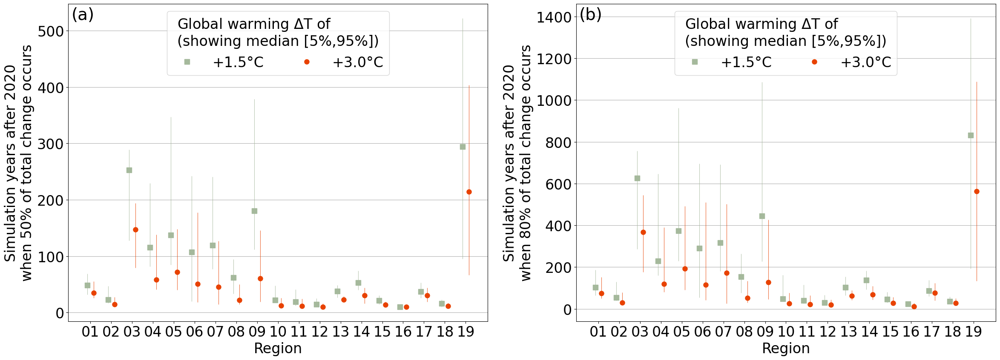

In [6]:
plt.rc('font', size=24)  
p_add = '_shifted'

markers = ['^', 'X','s','o','D','v']
markers_sel = ['s','o']
markers_sel_d = {'1.5':'s', '3.0':'o'}
def get_glob_temp_exp(region='global'):
    pd_global_temp_exp_glac = pd.read_csv('../data/temp_ch_ipcc_isimip3b_glacier_regionally.csv', index_col = 0)
    _p = pd_global_temp_exp_glac.loc[pd_global_temp_exp_glac.region == region]
    #print(_p.groupby(['gcm','period_scenario']).mean('temp_ch_ipcc'))
    _p = _p.groupby(['gcm','period_scenario']).mean('temp_ch_ipcc')
    return _p
glob_temp_ch = get_glob_temp_exp(region='global')['temp_ch_ipcc'].values
from matplotlib.colors import LinearSegmentedColormap
from sklearn.preprocessing import MinMaxScaler
only_12_range = False
if only_12_range:
    colors_icci_l3 = ['#70B8FF', '#FABB00', '#F25100', '#D42300', '#B3001E', '#800040', '#550066', '#2B084D']
    cmap_icci_3 = LinearSegmentedColormap.from_list('bins_100', colors_icci_l3, N=1000)
    # IDEA --> Let's scale from 1.2 onwards
    scaler = MinMaxScaler()
    temp_ch_sel = np.arange(1.2,glob_temp_ch.max(),0.25)
    scaler.fit(temp_ch_sel.reshape(-1,1))
    cmap = cmap_icci_3
else:
    ## '#306BAF', '#1A488A', '#002966'
    ## '#4D8ED6',
    colors_full_temp_range = ['#002966', '#306BAF', '#70B8FF','#FABB00', '#F25100', '#D42300', '#B3001E', '#800040', '#550066', '#2B084D']
    cmap_full_temp_range = LinearSegmentedColormap.from_list('bins_100', colors_full_temp_range, N=1000)
    # IDEA --> Let's scale from the entire range onwards onwards
    scaler = MinMaxScaler()
    temp_ch_sel = np.arange(-0.36,glob_temp_ch.max(),0.25)# need to manually set the minimum to a lower value to have a light blue color at ~1.2°C
    scaler.fit(temp_ch_sel.reshape(-1,1))
    cmap = cmap_full_temp_range

norm = plt.Normalize(vmin=-0.36, vmax=glob_temp_ch.max()) # we need the -0.4 for the correct norm 
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
#sm.set_clim(glob_temp_ch.min(),glob_temp_ch.max())
# ok, both approaches work the same 
assert sm.cmap == cmap

t = 1.2
import matplotlib.colors as mcolors
# just want to make sure that 1.2°C is this color here: '#70B8FF'
hex_color = '#70B8FF'
rgba_color = mcolors.to_rgba(hex_color)
c1=sm.cmap(scaler.transform(np.array(t).reshape(-1,1))).squeeze()
c2=cmap(scaler.transform(np.array(t).reshape(-1,1))).squeeze()
np.testing.assert_allclose(c1,c2)
np.testing.assert_allclose(c1,rgba_color)


col_temp_l_sel_n = [1.2, 1.5, 2.0, 3.0]
cols_n = []
for temp in col_temp_l_sel_n: #,5,6]:
    #sm.colorbar.norm...
    #col_temp = cmap(norm(temp))
    c=cmap(scaler.transform(np.array(temp).reshape(-1,1)))
    cols_n.append(c)
markers_sel_n = markers_sel #[markers_sel[1],markers_sel[2],markers_sel[3],markers_sel[4]]
#cols_n = sns.color_palette(cols_n)


# it is better to extract that directly, then we can also get the spread already 
_resp_time = pd.read_csv('resp_time_shifted_X%_threshold25%_for_deltaT_rgi_reg_roll_volume_21yravg.csv', index_col=[0])

fig, axs = plt.subplots(1,2, figsize=(24,9))
axs = axs.flatten()
ax = axs[0]
d_temp = 0.2
boxplot = False
for ax,perc in zip(axs,[50, 80]):
    r_l = []

    for j,rgi_reg in enumerate(_resp_time.rgi_reg.unique()):
        _resp_time_r = _resp_time.loc[_resp_time.rgi_reg==rgi_reg]
        for temp,sh in zip([1.5,3.0],[-0.15,+0.15]): 
            color = cmap(scaler.transform(np.array(temp).reshape(-1,1))).squeeze()
            _resp_time_r_temp = _resp_time_r.loc[(_resp_time_r.temp_ch_ipcc>=temp-d_temp) & (_resp_time_r.temp_ch_ipcc<=temp+d_temp)]
            _resp_time_r_temp_sel = _resp_time_r_temp[[f'resp_time_-{perc}%']].quantile([0.05,0.25,0.5,0.75,0.95])
            if boxplot:
                item = {}
                #item["label"] = 'box' # not required
                item["med"] = _resp_time_r_temp_sel.loc[0.50]
                item["q1"] = _resp_time_r_temp_sel.loc[0.25]
                item["q3"] = _resp_time_r_temp_sel.loc[0.75]
                #item["cilo"] = 5.3 # not required
                #item["cihi"] = 5.7 # not required
                item["whislo"] = _resp_time_r_temp_sel.loc[0.05]
                item["whishi"] = _resp_time_r_temp_sel.loc[0.95]
                stats = [item]
                boxprops = dict(linestyle='-', linewidth=1, color=color)
                whisprops = dict(color=color, linewidth=0.5)
                flierprops = dict(marker='o', markerfacecolor='green', markersize=0,
                                  markeredgecolor='none')
                medianprops = dict(linestyle='-', linewidth=3, color=color)
                ax.bxp(stats, positions = [j+sh], #0, #[p + j]
                       showfliers = False,
                        flierprops= flierprops, medianprops=medianprops, boxprops=boxprops,
                         widths=0.25, #patch_artist=True,
                        whiskerprops=whisprops, capprops = dict(color=color, linewidth=0.5))
            else:
                ax.plot([j+sh], [_resp_time_r_temp_sel.loc[0.5].values],
                        markers_sel_d[str(temp)], color = color, ms=8, label = f'+{temp}°C')
                ax.vlines([j+sh], [_resp_time_r_temp_sel.loc[0.05].values], [_resp_time_r_temp_sel.loc[0.95]], alpha = 0.8, lw=0.8, color = color)
        if j == 0:
            ax.legend(loc='upper center', title= r'Global warming $\Delta$T of'+f'\n(showing median [5%,95%])', ncol=2)
            #handlesa, labelsb = ax.get_legend_handles_labels()
            #eg = ax.legend([handlesa[0], handlesb[-1]], ['+1.5°C', '+3.0°C'],loc='upper left', title= r'for a $\Delta$T of', ncol=4)
        #r_l_j.append(
        if boxplot:
            r_l.append(f'  {rgi_reg[3:]}')
            r_l.append('')
        else:
            r_l.append(f'{rgi_reg[3:]}')


    ax.set_xticks(np.arange(0,19,1),r_l)
    ax.grid(axis='y')
    ax.set_xlabel('Region')
    ax.set_ylabel(f'Simulation years after 2020\nwhen {perc}% of total change occurs')

    
for j,axi in enumerate(axs):
    num_text_x = 0.007
    num_text_y = 0.95

    axi.text(num_text_x, num_text_y,
             num_dict[j], fontsize=28, transform=axi.transAxes)

plt.tight_layout()
plt.savefig(f'figures/3_response_time/3_resp_time{p_add}_summary_w_uncertainties_{DATE}.png', dpi = 100)

In [25]:
temp = 1.5
d_temp = 0.2
_resp_time_temp = _resp_time.loc[(_resp_time.temp_ch_ipcc>=temp-d_temp) & (_resp_time.temp_ch_ipcc<=temp+d_temp)]
_resp_time_temp['resp_time_-80%'].quantile([0.75])

0.75    257.0
Name: resp_time_-80%, dtype: float64

## Other response time estimates (e.g. comparison between models) ... NOT UPDATED after FEB2024

In [25]:
dt = pd_response_time_x_perc_loss_comp.loc[pd_response_time_x_perc_loss_comp.temp_ch_ipcc>=0.8]

In [39]:
dt.where(dt['resp_time_-50%']>600).dropna()

,rgi_reg,model_author,temp_ch_ipcc,min_perc_change,resp_time_-50%,resp_time_-80%,resp_time_-90%,diff_resp_time_-50%,diff_resp_time_-80%,diff_resp_time_-90%,temp_ch_classes
5936,RGI09,GLIMB,0.844940,12.2,637.0,1607.0,2458.0,384.0,1041.0,1581.0,-0.2°C-2.0°C (n=42)
5939,RGI09,GLIMB,0.998767,12.2,875.0,1951.0,2704.0,631.0,1317.0,1524.0,-0.2°C-2.0°C (n=42)
8344,RGI12,OGGM-VAS,1.468303,12.2,1705.0,23.0,1921.0,1684.5,-27.5,1604.5,-0.2°C-2.0°C (n=42)
8416,RGI12,OGGM_v16,0.844940,12.2,1505.0,1061.0,1876.0,1484.0,1006.5,902.0,-0.2°C-2.0°C (n=42)
9135,RGI13,OGGM_v16,0.841467,12.2,1973.0,1961.0,2007.0,1933.0,1813.0,1796.0,-0.2°C-2.0°C (n=42)
11936,RGI17,OGGM-VAS,0.844940,12.2,4265.0,439.0,3754.0,4210.0,303.0,3524.0,-0.2°C-2.0°C (n=42)
12434,RGI18,GLIMB,1.645489,12.2,611.0,4208.0,3135.0,590.5,4164.5,3071.5,-0.2°C-2.0°C (n=42)
12435,RGI18,GLIMB,1.666324,12.2,3584.0,228.0,1922.0,3569.0,191.0,1506.0,-0.2°C-2.0°C (n=42)
12656,RGI18,OGGM-VAS,0.844940,12.2,3675.0,2635.0,2136.0,3652.0,1283.5,1458.5,-0.2°C-2.0°C (n=42)
12657,RGI18,OGGM-VAS,0.853313,12.2,3866.0,2430.0,3513.0,3846.5,2361.5,2979.5,-0.2°C-2.0°C (n=42)


In [119]:
# compute amount of RGI regions per model 
pd_regional_sum_initial_models = ds_reg_models_extend.sel(simulation_year=0).to_dataframe()
pd_regional_sum_initial_models = pd_regional_sum_initial_models.reset_index()
#pd_reg_models = pd_reg_models.dropna()
pd_reg_models_count = pd_regional_sum_initial_models.groupby(['rgi_reg', 'model_author'])['volume_m3'].count().reset_index()
pd_reg_models_count = pd_reg_models_count.rename(columns={'volume_m3':'n_experiments'})
total_count= pd_reg_models_count.groupby('model_author').sum()

labels_l = []
labels_l_anonym = []
for j,n in enumerate((total_count/80).round(0).astype(int).loc[hue_order].values.squeeze()):
    if n==1:
        label = f'{hue_order[j]} ({n} region)'
        label_a = f'{hue_order_anonymous[j]} ({n} region)' 
    else:
        label = f'{hue_order[j]} ({n} regions)'
        label_a = f'{hue_order_anonymous[j]} ({n} regions)'
    labels_l.append(label)
    labels_l_anonym.append(label_a)

In [120]:
pd_response_time_x_perc_loss_comp.temp_ch_classes

85       -0.2°C-2.0°C (n=42)
93       -0.2°C-2.0°C (n=42)
94       -0.2°C-2.0°C (n=42)
95       -0.2°C-2.0°C (n=42)
96       -0.2°C-2.0°C (n=42)
                ...         
13595      4.0°C-6.9°C (n=8)
13596      4.0°C-6.9°C (n=8)
13597      4.0°C-6.9°C (n=8)
13598      4.0°C-6.9°C (n=8)
13599      4.0°C-6.9°C (n=8)
Name: temp_ch_classes, Length: 6846, dtype: object

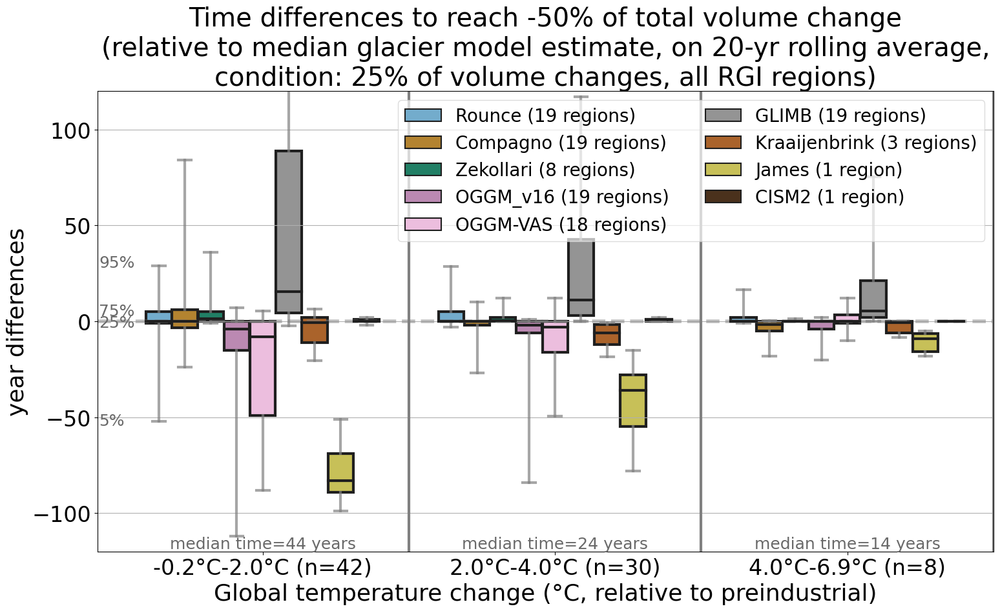

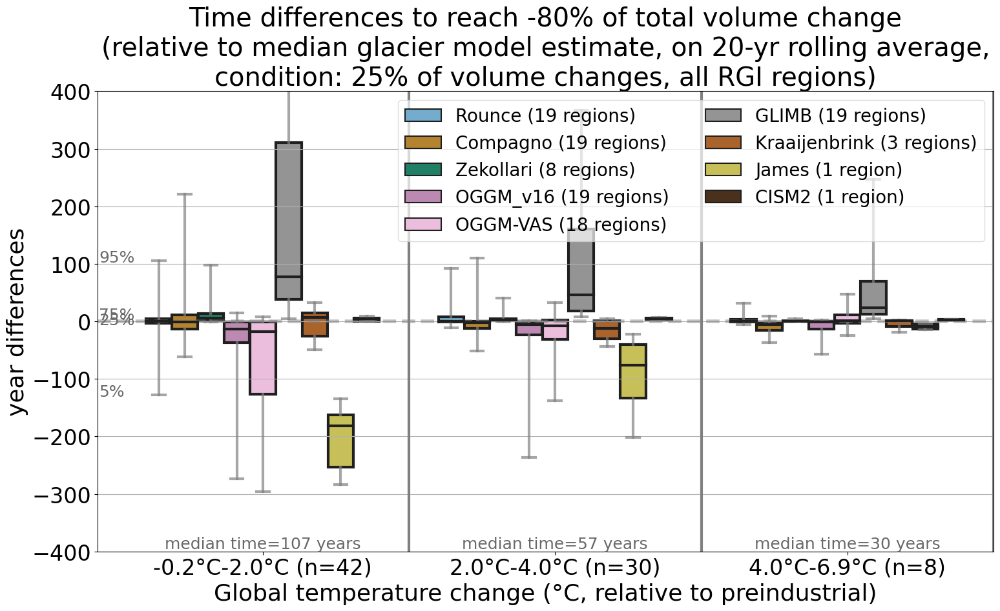

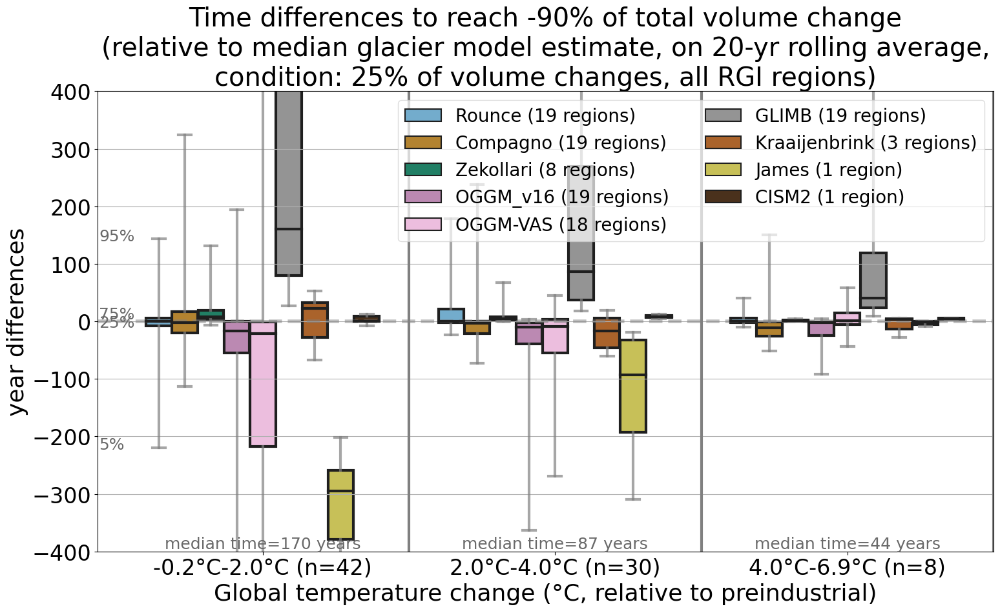

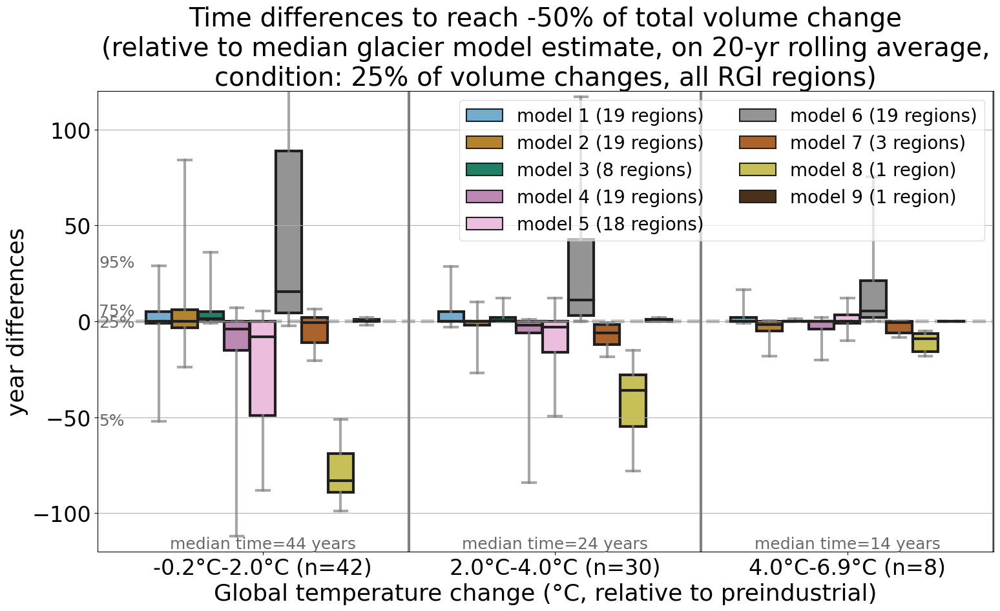

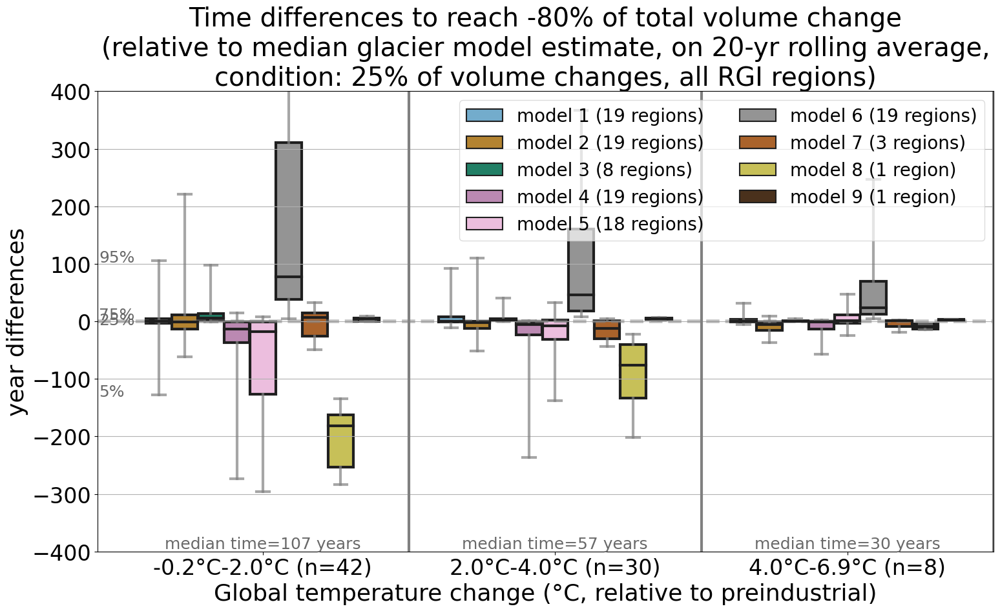

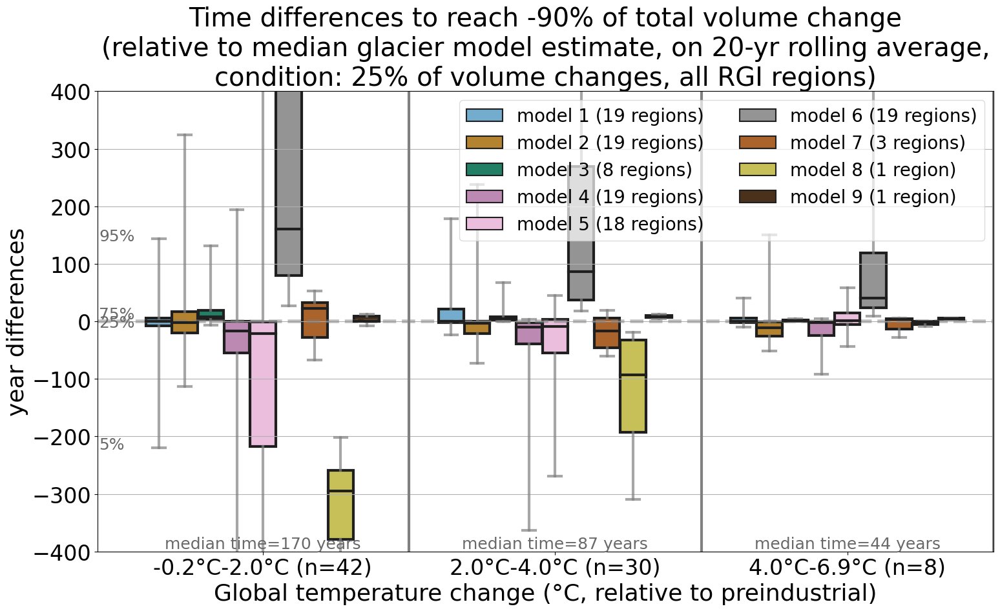

In [121]:

for anonym in ['', '_anonym']:
    for p in [-50,-80,-90]:
        plt.figure(figsize=(16,10))
        plt.rc('font', size=24)  
        sns.boxplot(data=pd_response_time_x_perc_loss_comp, hue='model_author', y=f'diff_resp_time_{p}%',
                    x='temp_ch_classes', palette=pal_models, saturation=0.6,
                       hue_order=hue_order, dodge = True, #hue='ssp',
                                        fliersize=0, whis = [5,95], 
                                        #y = 'time', #hue_order = ['2040', '2100'],
                                        linewidth=3,
                                        capprops={'color':'grey', 'alpha':0.7},
                                        whiskerprops={'color':'grey', 'alpha':0.7},)
        plt.grid(axis='y')
        plt.title(f'Time differences to reach {p}% of total volume change\n(relative to median glacier model estimate, on 20-yr rolling average,\ncondition: 25% of volume changes, all RGI regions)')
        plt.ylabel(r'year differences', fontsize=26)
        plt.xlabel('Global temperature change (°C, relative to preindustrial)', fontsize=26)
        for f in np.arange(0.5,3,1):
            plt.axvline(f, color= 'grey', ls='-', lw=3)

        ax = plt.gca()
        _leg = ax.get_legend()
        handles, labels = ax.get_legend_handles_labels()
        _leg.remove()
        #n = len(hue_order)
        if anonym=='_anonym':
            leg = ax.legend(handles, labels_l_anonym, #title=f'{n} models',
                            loc='upper right', framealpha = 0.7, ncol=2, fontsize=20)
        else:
            leg = ax.legend(handles, labels_l, #title=f'{n} models',
                            loc='upper right', framealpha = 0.7, ncol=2, fontsize=20)
        if p==-50:
            plt.ylim([-120, 120])
        else:
            plt.ylim([-400, 400])

        qs = pd_response_time_x_perc_loss_comp.groupby(['model_author',
                                                        'temp_ch_classes'])[f'diff_resp_time_{p}%'].quantile([0.05,0.25,
                                                                                                              0.75,0.95]).loc[('Rounce', '-0.2°C-2.0°C (n=42)')].values
        for pp,q in enumerate(qs):
            perci = [5,25,75,95][pp]
            if perci <=75:
                ax.text(-0.56,q-2,f'{perci}%', color = 'dimgrey', fontsize=18)
            else:
                ax.text(-0.56,q*0.98,f'{perci}%', color = 'dimgrey', fontsize=18)
        med_resp_time_temp_ch_classes = pd_response_time_x_perc_loss_comp.groupby('temp_ch_classes').median()[f'resp_time_{p}%']
        plt.axhline(0, ls='--', color='grey', lw=4, alpha = 0.5)

        for e,r in enumerate(med_resp_time_temp_ch_classes.values):
            text = f'median time={int(r)} years'
            if p==-50:
                ax.text(e,0.-120,f'{text}', color = 'dimgrey', fontsize=18, ha='center', va='bottom', zorder=6)
            else:
                ax.text(e,-400,f'{text}', color = 'dimgrey', fontsize=18, ha='center', va='bottom', zorder=6)


        xlim0,xlim1 = ax.get_xlim()
        plt.xlim([-0.565,xlim1])
        plt.tight_layout()
        plt.savefig(f'figures/3_response_time/3_response_time_glacier_model_diff_boxplot_5000yrs{anonym}_{p}%change.png')

### regional 

In [122]:
for r in rgi_regs:
    pd_response_time_x_perc_loss_comp_rgi_reg = pd_response_time_x_perc_loss_comp.loc[pd_response_time_x_perc_loss_comp.rgi_reg=='RGI'+r].dropna()
    rgi_reg = f'RGI{r}'
    rgi_reg_long = f'{d_reg_num_name[r]} ({rgi_reg})'

    for anonym in ['','_anonym']: # --> would need to update the code to have the right legend!!!
        for p in [-50,-80,-90]:
            plt.figure(figsize=(16,10))
            plt.rc('font', size=24)  
            sns.boxplot(data=pd_response_time_x_perc_loss_comp_rgi_reg, hue='model_author', y=f'diff_resp_time_{p}%',
                        x='temp_ch_classes', palette=pal_models, saturation=0.6,
                       hue_order=hue_order, dodge = True, #hue='ssp',
                                            fliersize=0, whis = [5,95], 
                                            #y = 'time', #hue_order = ['2040', '2100'],
                                            linewidth=3,
                                            capprops={'color':'grey', 'alpha':0.7},
                                            whiskerprops={'color':'grey', 'alpha':0.7},)
            plt.grid(axis='y')
            plt.title(f'Time differences to reach {p}% of total volume change\n(relative to median glacier model estimate, on 20-yr rolling average,\ncondition: 25% of volume changes)')
            plt.ylabel(r'year differences', fontsize=26)
            plt.xlabel('Global temperature change (°C, relative to preindustrial)', fontsize=26)
            for f in np.arange(0.5,3,1):
                plt.axvline(f, color= 'grey', ls='-', lw=3)

            ax = plt.gca()



            _leg = ax.get_legend()
            handles, labels = ax.get_legend_handles_labels()
            _leg.remove()
            n = len(hue_order)
            if anonym=='_anonym':
                leg = ax.legend(handles, hue_order_anonymous, #title=f'{n} models',
                                loc='upper right', framealpha = 0.7, ncol=3, fontsize=20)
            else:
                leg = ax.legend(handles, hue_order, #title=f'{n} models',
                                loc='upper right', framealpha = 0.7, ncol=3, fontsize=20)
            ylim0,ylim1 = ax.get_ylim()

            plt.ylim([ylim0*0.8, ylim1*0.8])

            qs = pd_response_time_x_perc_loss_comp_rgi_reg.groupby(['model_author', 'temp_ch_classes'])[f'diff_resp_time_{p}%'].quantile([0.05,0.25,0.75,0.95]).loc[('Rounce', '-0.2°C-2.0°C (n=42)')].values
            for pp,q in enumerate(qs):
                perci = [5,25,75,95][pp]
                if perci <=75:
                    ax.text(-0.56,q,f'{perci}%', color = 'dimgrey', fontsize=18)
                else:
                    ax.text(-0.56,q,f'{perci}%', color = 'dimgrey', fontsize=18)
            med_resp_time_temp_ch_classesreg = pd_response_time_x_perc_loss_comp_rgi_reg.groupby('temp_ch_classes').median()[f'resp_time_{p}%']

            for e,r in enumerate(med_resp_time_temp_ch_classesreg.values):
                text = f'median time={int(r)} years'
                ax.text(e,ylim0*0.8,f'{text}', color = 'dimgrey', fontsize=18, ha='center', va='bottom')

            plt.axhline(0, ls='--', color='grey', lw=4, alpha = 0.5)

            xlim0,xlim1 = ax.get_xlim()
            plt.xlim([-0.565,xlim1])
            plt.tight_layout()
            plt.savefig(f'figures/3_response_time/3_response_time_glacier_model_diff_boxplot_5000yrs{anonym}_{rgi_reg}_{p}%change.png')
            plt.close()

### Old

AttributeError: 'NoneType' object has no attribute 'remove'

<Figure size 3000x4000 with 0 Axes>

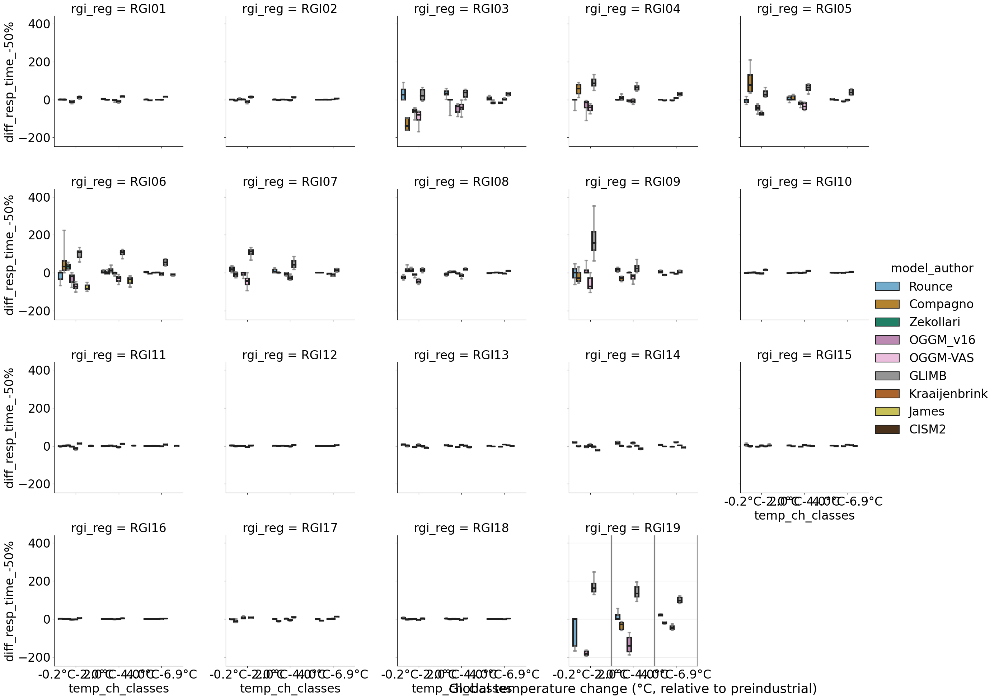

In [88]:

for anonym in ['']: #, '_anonym']:
    plt.figure(figsize=(30,40))
    plt.rc('font', size=24)  
    sns.catplot(data=pd_response_time_50_perc_loss_comp, hue='model_author', y='diff_resp_time_-50%',
                kind='box', col='rgi_reg',col_wrap=5,
                x='temp_ch_classes', palette=pal_models, saturation=0.6,
               hue_order=hue_order, dodge = True, #hue='ssp',
                                    fliersize=0, whis = [5,95], 
                                    #y = 'time', #hue_order = ['2040', '2100'],
                                    linewidth=3,
                                    capprops={'color':'grey', 'alpha':0.7},
                                    whiskerprops={'color':'grey', 'alpha':0.7},)
    plt.grid(axis='y')
    #plt.title('"Response" time differences (relative to median glacier model estimate)\n(condition: 25% of volume changes, def: year where 50% of change occurs, all RGI regions)')
    plt.ylabel(r'"Response" time differences (years)', fontsize=26)
    plt.xlabel('Global temperature change (°C, relative to preindustrial)', fontsize=26)
    for f in np.arange(0.5,3,1):
        plt.axvline(f, color= 'grey', ls='-', lw=3)

    ax = plt.gca()
    _leg = ax.get_legend()
    handles, labels = ax.get_legend_handles_labels()
   # _leg.remove()
    #n = len(hue_order)
    if anonym=='_anonym':
        leg = ax.legend(handles, labels_l_anonym, #title=f'{n} models',
                        loc='upper right', framealpha = 0.7, ncol=2, fontsize=20)
    else:
        leg = ax.legend(handles, labels_l, #title=f'{n} models',
                        loc='upper right', framealpha = 0.7, ncol=2, fontsize=20)
    plt.ylim([-120, 120])
    
    qs = pd_response_time_50_perc_loss_comp.groupby(['model_author', 'temp_ch_classes'])['diff_resp_time_-50%'].quantile([0.05,0.25,0.75,0.95]).loc[('Rounce', '-0.2°C-2.0°C')].values
    for p,q in enumerate(qs):
        perci = [5,25,75,95][p]
        if perci <=75:
            ax.text(-0.56,q-2,f'{perci}%', color = 'dimgrey', fontsize=18)
        else:
            ax.text(-0.56,q*0.98,f'{perci}%', color = 'dimgrey', fontsize=18)
    med_resp_time_temp_ch_classes.values
    for e,r in enumerate(med_resp_time_temp_ch_classes.values):
        text = f'median response time={int(r)} years'
        ax.text(e,0.-120,f'{text}', color = 'dimgrey', fontsize=18, ha='center', va='bottom')

    
    xlim0,xlim1 = ax.get_xlim()
    plt.xlim([-0.565,xlim1])
    plt.tight_layout()
    #plt.savefig(f'figures/3_response_time_glacier_model_diff_boxplot_5000yrs{anonym}.png')